# EDA Notebook
---
#### Team 14: Carlos Moreno, Elizabeth Khan, Jagan Lakshmipathy, and Ziling Huang


__Summary:__

The purpose of this report is to facilitate a consulting study on how to improve customer experience with regard to predicting departure delays for an online booking agency client.

This is an EDA of the 6-month flights dataset and the processed and joined weather dataset. We will describe, explain the data and discuss some problems to address with the data.

The flights data contains information on flights, airport locations, timings, departures and arrivals and their associated delays and root causes. Around 50% of the variables had more than 50% of its data missing. This would require careful consideration of imputation of mean, rolling averages and unknown category to clean up the data based on our understanding of the data. We also noticed a number of categorical fields which would require conversion to numbers and one-hot encoding in future. Furthermore, the subject of predicting departures occurs in a time-series context meaning we would have to take extra care to ensure no data leakage occurs by excluding information occurring within 2 hours of or after departure such as departure delay by cause. This would strengthen the robustness of our predictive algorithm and results. Nevertheless, it is beneficial to our future feature engineering direction to note that majority of the departure delays occurred with aircraft and previous flight arriving late. Data cleaning needs to be done to remove cancelled flights records from the dataset. We found that standardization of the timezones between the flights dataset and weather dataset was critical to be able to join data within a 1 hour window prior to the 2 hours before departure. A corrrelation analysis was performed to identify and potentially eliminate closely correlated variables such as departure information and arrival information to reduce multi-collinearity in our model. An analysis of the top and bottom 10 routes was made to identify routes where flight delay prediction is critical to customer satisfaction and revenue. A page rank was performed to identify the most important airports. Finally, we observed that there was some relationship between the month of the year and departure delays. 

The weather data contains information on weather indicators of which some are used by airlines in determining safety conditions for flight takeoff and landing. An analysis showed that poor visibility, low-hanging clouds and low temperatures seem to be prevalent in instances where departure delays occur versus those when they do not. The weather data contains a number of data fields such as WND and CIG which have metrics concatenated with codes and requiring parsing to retrieve valuable information. In a correlation analysis performed, we did not observe strong correlation between weather and departure delay.

The stations data contains useful information that facilitate joins between the flights and weather data.

##Setup and import libraries

In [0]:
from pyspark.sql.functions import *
import pyspark.sql.functions as F
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pylab import rcParams
import matplotlib.ticker as mtick
import seaborn as sns
from graphframes import *
import geopandas as gpd
import plotly as plotly
!pip install heatmapz
from heatmap import heatmap, corrplot

pd.set_option("display.max_rows", 999)
pd.set_option("display.max_columns", 200)


from pyspark.ml import *
from pyspark.ml.linalg import *
from pyspark.ml.stat import *
from pyspark.ml.feature import *
from pyspark.sql.window import *

#Blob credentials
blob_container = "cemgr14c" # The name of your container created in https://portal.azure.com
storage_account = "cemgr14" #The name of your Storage account created in https://portal.azure.com
secret_scope = "w261gr14" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "keygr14" # The name of the secret key created in your local computer using the Databricks CLI
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

Requirement already satisfied: heatmapz in /databricks/python3/lib/python3.8/site-packages (0.0.4)
Requirement already satisfied: pandas in /databricks/python3/lib/python3.8/site-packages (from heatmapz) (1.2.4)
Requirement already satisfied: matplotlib>=3.0.3 in /databricks/python3/lib/python3.8/site-packages (from heatmapz) (3.4.2)
Requirement already satisfied: seaborn in /databricks/python3/lib/python3.8/site-packages (from heatmapz) (0.11.1)
Requirement already satisfied: kiwisolver>=1.0.1 in /databricks/python3/lib/python3.8/site-packages (from matplotlib>=3.0.3->heatmapz) (1.3.1)
Requirement already satisfied: numpy>=1.16 in /databricks/python3/lib/python3.8/site-packages (from matplotlib>=3.0.3->heatmapz) (1.19.2)
Requirement already satisfied: cycler>=0.10 in /databricks/python3/lib/python3.8/site-packages (from matplotlib>=3.0.3->heatmapz) (0.10.0)
Requirement already satisfied: pillow>=6.2.0 in /databricks/python3/lib/python3.8/site-packages (from matplotlib>=3.0.3->heatmapz) (8.2.0)
Requirement already satisfied: pyparsing>=2.2.1 in /databricks/python3/lib/python3.8/site-packages (from matplotlib>=3.0.3->heatmapz) (2.4.7)
Requirement already satisfied: python-dateutil>=2.7 in /databricks/python3/lib/python3.8/site-packages (from matplotlib>=3.0.3->heatmapz) (2.8.1)
Requirement already satisfied: six in /databricks/python3/lib/python3.8/site-packages (from cycler>=0.10->matplotlib>=3.0.3->heatmapz) (1.15.0)
Requirement already satisfied: pytz>=2017.3 in /databricks/python3/lib/python3.8/site-packages (from pandas->heatmapz) (2020.5)
Requirement already satisfied: scipy>=1.0 in /databricks/python3/lib/python3.8/site-packages (from seaborn->heatmapz) (1.6.2)
 WARNING: You are using pip version 21.0.1; however, version 22.0.4 is available.
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.

In [0]:
# SAS Token

spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)


In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls(f"{mount_path}/datasets_final_project"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


In [0]:
# Inspect our Team's data blob 
display(dbutils.fs.ls(f"{blob_url}"))

path,name,size
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_joins_sel/,airline_joins_sel/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_joins_sel.delta/,airline_joins_sel.delta/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_joins_sel_CEM/,airline_joins_sel_CEM/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_pr_cem.delta/,airline_pr_cem.delta/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_rank_CEM_CAR1.delta/,airline_rank_CEM_CAR1.delta/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_rank_CEM_CAR20.delta/,airline_rank_CEM_CAR20.delta/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_test_CEM_CAR1.delta/,airline_test_CEM_CAR1.delta/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_test_sel/,airline_test_sel/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_test_sel.delta/,airline_test_sel.delta/,0
wasbs://cemgr14c@cemgr14.blob.core.windows.net/airline_test_sel_CEM.delta/,airline_test_sel_CEM.delta/,0


##Read data

In [0]:
# Load 2015 Q1-2 for Flights
df_airlines = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/")

#Load 2015 Q1-2 Weather Data
df_weather = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(col('DATE') < "2015-07-01T00:00:00.000")

#Load Stations Data
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")

## Data Explanation and Visualizations

### Flights Data

The flights data contains flight data from Q1-2 2015. Here are some statistics on the flight data:
- 109 columns in the dataset
- 53 columns with more than 50% of data missing
- While weather contributes to only less than 15% of all causes of delay the two major causes of delay are Late-arriving aircraft and Air carrier-related.

The outcome variables we have selected for the study are:
- 'DEP_DEL15': Departure Delay Indicator, 15 Minutes or More (1=Yes)
- 'DEP_DELAY': Difference in minutes between scheduled and actual departure time. Early departures show negative numbers.
- 'DEP_DELAY_NEW': Same as above but with negative numbers converted to zeroes.

We will be dropping flight records which were cancelled i.e. 'Cancelled' = 1 since they would never depart. We will also drop the following since these are not relevant to the study:
- 'CANCELLED': Cancelled Flight Indicator (1=Yes)
- 'CANCELLATION_CODE': Specifies The Reason For Cancellation

We will drop the following variables because these are closely associated with the outcome variable of departure delay. Nevertheless, they provide useful pointers for future feature engineering:
- CARRIER_DELAY: Carrier Delay, in Minutes
- WEATHER_DELAY: Weather Delay, in Minutes
- NAS_DELAY: National Air System Delay, in Minutes
- SECURITY_DELAY: Security Delay, in Minutes
- LATE_AIRCRAFT_DELAY: Late Aircraft Delay, in Minutes

The following variables are dropped since their values are only known within 2 hours of departure or after departure and including these would reduce the reliability of our study:
- 'ACTUAL_ELAPSED_TIME': Elapsed Time of Flight, in Minutes
- 'CRS_ELAPSED_TIME': CRS Elapsed Time of Flight, in Minutes
- 'AIR_TIME': Flight Time, in Minutes
- 'TAXI_IN': Taxi In Time, in Minutes
- 'TAXI_OUT': Taxi Out Time, in Minutes
- 'WHEELS_ON': Wheels On Time (local time: hhmm)
- 'WHEELS_OFF': Wheels Off Time (local time: hhmm)
- 'DIVERTED': Diverted Flight Indicator (0 or 1)
- All columns starting with DIV to DIV5

To avoid data leakage, arrival data which will only be known after departure will not be included:
- 'ARR_TIME': Actual Arrival Time (local time: hhmm)
- 'ARR_DEL15': Arrival Delay Indicator, 15 Minutes or More (1=Yes)
- 'ARR_DELAY': Difference in minutes between scheduled and actual arrival time. Early arrivals show negative numbers.
- 'ARR_DELAY_NEW': Same as above but with negative numbers converted to zeros. 
- 'ARR_DEL15': Arrival Delay Indicator, 15 Minutes or More (1=Yes)
- 'ARR_TIME_BLK': CRS Arrival Time Block, Hourly Intervals
- 'ARR_DELAY_GROUP': Arrival Delay intervals, every (15-minutes from <-15 to >180)
- 'CRS_ARR_TIME': CRS Arrival Time (local time: hhmm)

Duplicate data columns such as the following are removed since it does not provide useful information:
- OP_UNIQUE_CARRIER
- ORIGIN_AIRPORT_SEQ_ID 
- DEST_AIRPORT_SEQ_ID

Based on our research, the Bureau of Transport Statistics explains the following cause of delays as follows:
- Air Carrier: The cause of the cancellation or delay was due to circumstances within the airline's control (e.g. maintenance or crew problems, aircraft cleaning, baggage loading, fueling, etc.).
- Extreme Weather: Significant meteorological conditions (actual or forecasted) that, in the judgment of the carrier, delays or prevents the operation of a flight such as tornado, blizzard or hurricane.
- National Aviation System (NAS): Delays and cancellations attributable to the national aviation system that refer to a broad set of conditions, such as non-extreme weather conditions, airport operations, heavy traffic volume, and air traffic control.
- Late-arriving aircraft: A previous flight with same aircraft arrived late, causing the present flight to depart late.
- Security: Delays or cancellations caused by evacuation of a terminal or concourse, re-boarding of aircraft because of security breach, inoperative - screening equipment and/or long lines in excess of 29 minutes at screening areas.

Our initial research and readings also pointed to delays being associated with temporal factors such as time of day, day of week, season of the year and non-extreme weather. 

Additionally, we observed that flight times are recorded in local time but weather data mentioned below is recorded in GMT time. This will need to be standardized.

Here is a view of 1000 rows of the flights data:

In [0]:
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202,-8.0,0.0,0.0,-1,1200-1259,15.0,1217,1356,6.0,1414,1402,-12.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,244.0,240.0,219.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,24,5,2015-04-24,AA,19805,AA,N3BAAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214,4.0,4.0,0.0,0,1200-1259,19.0,1233,1417,12.0,1414,1429,15.0,15.0,1.0,1,1400-1459,0.0,null,0.0,244.0,255.0,224.0,1.0,1440.0,6,0.0,0.0,15.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,25,6,2015-04-25,AA,19805,AA,N3CUAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254,44.0,44.0,1.0,2,1200-1259,24.0,1318,1441,4.0,1414,1445,31.0,31.0,1.0,2,1400-1459,0.0,null,0.0,244.0,231.0,203.0,1.0,1440.0,6,31.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205,-5.0,0.0,0.0,-1,1200-1259,11.0,1216,1326,4.0,1414,1330,-44.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,205.0,190.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,27,1,2015-04-27,AA,19805,AA,N3DMAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1219,9.0,9.0,0.0,0,1200-1259,11.

Here is the data schema for the flight data:

In [0]:
df_airlines.printSchema()

root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- OP_CARRIER_AIRLINE_ID: integer (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: integer (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_AIRPORT_SEQ_ID: integer (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- ORIGIN_STATE_FIPS: integer (nullable = true)
-- ORIGIN_STATE_NM: string (nullable = true)
-- ORIGIN_WAC: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_SEQ_ID: integer (nullable = true)
-- DEST_CITY_MARKET_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DEST_STATE_FIPS: integer (nullable = true)
-- DEST_STATE_NM: string (nullable = true)
-- DEST_WAC: integer (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_TIME: integer (nullable = true)
-- DEP_DELAY: double (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- DEP_DELAY_GROUP: integer (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- TAXI_OUT: double (nullable = true)
-- WHEELS_OFF: integer (nullable = true)
-- WHEELS_ON: integer (nullable = true)
-- TAXI_IN: double (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- ARR_TIME: integer (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_DEL15: double (nullable = true)
-- ARR_DELAY_GROUP: integer (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- CANCELLED: double (nullable = true)
-- CANCELLATION_CODE: string (nullable = true)
-- DIVERTED: double (nullable = true)
-- CRS_ELAPSED_TIME: double (nullable = true)
-- ACTUAL_ELAPSED_TIME: double (nullable = true)
-- AIR_TIME: double (nullable = true)
-- FLIGHTS: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: integer (nullable = true)
-- CARRIER_DELAY: double (nullable = true)
-- WEATHER_DELAY: double (nullable = true)
-- NAS_DELAY: double (nullable = true)
-- SECURITY_DELAY: double (nullable = true)
-- LATE_AIRCRAFT_DELAY: double (nullable = true)
-- FIRST_DEP_TIME: integer (nullable = true)
-- TOTAL_ADD_GTIME: double (nullable = true)
-- LONGEST_ADD_GTIME: double (nullable = true)
-- DIV_AIRPORT_LANDINGS: integer (nullable = true)
-- DIV_REACHED_DEST: double (nullable = true)
-- DIV_ACTUAL_ELAPSED_TIME: double (nullable = true)
-- DIV_ARR_DELAY: double (nullable = true)
-- DIV_DISTANCE: double (nullable = true)
-- DIV1_AIRPORT: string (nullable = true)
-- DIV1_AIRPORT_ID: integer (nullable = true)
-- DIV1_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV1_WHEELS_ON: integer (nullable = true)
-- DIV1_TOTAL_GTIME: double (nullable = true)
-- DIV1_LONGEST_GTIME: double (nullable = true)
-- DIV1_WHEELS_OFF: integer (nullable = true)
-- DIV1_TAIL_NUM: string (nullable = true)
-- DIV2_AIRPORT: string (nullable = true)
-- DIV2_AIRPORT_ID: integer (nullable = true)
-- DIV2_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV2_WHEELS_ON: integer (nullable = true)
-- DIV2_TOTAL_GTIME: double (nullable = true)
-- DIV2_LONGEST_GTIME: double (nullable = true)
-- DIV2_WHEELS_OFF: integer (nullable = true)
-- DIV2_TAIL_NUM: string (nullable = true)
-- DIV3_AIRPORT: string (nullable = true)
-- DIV3_AIRPORT_ID: integer (nullable = true)
-- DIV3_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV3_WHEELS_ON: integer (nullable = true)
-- DIV3_TOTAL_GTIME: double (nullable = true)
-- DIV3_LONGEST_GTIME: double (nullable = true)
-- DIV3_WHEELS_

DEP_DEL15 is an important data column. This is the Departure Delay Indicator, 15 Minutes or More (1=Yes) which we will be using as the target predictor variable for our analysis.

See preview of 5 rows of data from DEP_DEL15 column.

In [0]:
df_airlines.select('DEP_DEL15').show(5)

+---------+
DEP_DEL15|
+---------+
 0.0|
 0.0|
 1.0|
 0.0|
 0.0|
+---------+
only showing top 5 rows

DEP_DELAY is the departure delay of scheduled vs actual departure time in minutes. Early departures show negative numbers, see examples shown below. This is also be an outcome variable in our analysis.

In [0]:
df_airlines.createOrReplaceTempView('df_airlines')
check_dep_delay_neg = spark.sql("SELECT * FROM df_airlines WHERE DEP_DELAY<0")
display(check_dep_delay_neg)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202,-8.0,0.0,0.0,-1,1200-1259,15.0,1217,1356,6.0,1414,1402,-12.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,244.0,240.0,219.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205,-5.0,0.0,0.0,-1,1200-1259,11.0,1216,1326,4.0,1414,1330,-44.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,205.0,190.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,29,3,2015-04-29,AA,19805,AA,N3LGAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1206,-4.0,0.0,0.0,-1,1200-1259,20.0,1226,1321,4.0,1414,1325,-49.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,199.0,175.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,4,6,2015-04-04,AA,19805,AA,N426AA,168,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14492,1449202,34492,RDU,"Raleigh/Durham, NC",NC,37,North Carolina,36,1506,1502,-4.0,0.0,0.0,-1,1500-1559,16.0,1518,1739,4.0,1808,1743,-25.0,0.0,0.0,-2,1800-1859,0.0,null,0.0,122.0,101.0,81.0,1.0,646.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,7,2,2015-04-07,AA,19805,AA,N4XJAA,168,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14492,1449202,34492,RDU,"Raleigh/Durham, NC",NC,37,North Carolina,36,

See preview of 5 rows of data from DEP_DELAY column.

In [0]:
df_airlines.select('DEP_DELAY').show(5)

+---------+
DEP_DELAY|
+---------+
 -8.0|
 4.0|
 44.0|
 -5.0|
 9.0|
+---------+
only showing top 5 rows

There are 109 columns in the 6 month flight data.

In [0]:
len(df_airlines.columns)

Out[22]: 109

Find the percentage of missing null/nan values in each of the columns for flights dataset.

In [0]:
amount_missing_df_airlines = df_airlines.select([(count(when(isnan(c) | col(c).isNull(), c))/count(lit(1))).alias(c) for c in df_airlines.columns])
display(amount_missing_df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0030163367640833917,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.021490289408484225,0.021490289408484225,0.021490289408484225,0.021490289408484225,0.021490289408484225,0.0,0.022117829539971642,0.022117829539971642,0.022917055179130147,0.022917055179130147,0.0,0.022917055179130147,0.025074964404858107,0.025074964404858107,0.025074964404858107,0.025074964404858107,0.0,0.0,0.977677923907799,0.0,2.960094959846312E-6,0.025074964404858107,0.025074964404858107,0.0,0.0,0.0,0.7927015898670029,0.7927015898670029,0.7927015898670029,0.7927015898670029,0.7927015898670029,0.9932687440613095,0.9932687440613095,0.9932687440613095,0.0,0.9972471116873429,0.997842090774272,0.997842090774272,0.9972471116873429,0.9970428651351135,0.9970428651351135,0.9970428651351135,0.9970428651351135,0.9970428651351135,0.9970428651351135,0.9978006494448342,0.9978006494448342,0.9999437581957629,0.9999437581957629,0.9999437581957629,0.9999437581957629,0.9999437581957629,0.9999437581957629,0.9999822394302409,0.9999822394302409,0.9999970399050402,0.9999970399050402,0.9999970399050402,0.9999970399050402,0.9999970399050402,0.9999970399050402,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [0]:
columns_al = amount_missing_df_airlines.columns
amdfa =amount_missing_df_airlines.head(1)[0]
columns_to_drop_flight = []

for i in range(len(amdfa)):
  if amdfa[i] > 0.5:
    columns_to_drop_flight.append(columns_al[i])
    
columns_to_drop_flight


Out[24]: ['CANCELLATION_CODE',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'FIRST_DEP_TIME',
 'TOTAL_ADD_GTIME',
 'LONGEST_ADD_GTIME',
 'DIV_REACHED_DEST',
 'DIV_ACTUAL_ELAPSED_TIME',
 'DIV_ARR_DELAY',
 'DIV_DISTANCE',
 'DIV1_AIRPORT',
 'DIV1_AIRPORT_ID',
 'DIV1_AIRPORT_SEQ_ID',
 'DIV1_WHEELS_ON',
 'DIV1_TOTAL_GTIME',
 'DIV1_LONGEST_GTIME',
 'DIV1_WHEELS_OFF',
 'DIV1_TAIL_NUM',
 'DIV2_AIRPORT',
 'DIV2_AIRPORT_ID',
 'DIV2_AIRPORT_SEQ_ID',
 'DIV2_WHEELS_ON',
 'DIV2_TOTAL_GTIME',
 'DIV2_LONGEST_GTIME',
 'DIV2_WHEELS_OFF',
 'DIV2_TAIL_NUM',
 'DIV3_AIRPORT',
 'DIV3_AIRPORT_ID',
 'DIV3_AIRPORT_SEQ_ID',
 'DIV3_WHEELS_ON',
 'DIV3_TOTAL_GTIME',
 'DIV3_LONGEST_GTIME',
 'DIV3_WHEELS_OFF',
 'DIV3_TAIL_NUM',
 'DIV4_AIRPORT',
 'DIV4_AIRPORT_ID',
 'DIV4_AIRPORT_SEQ_ID',
 'DIV4_WHEELS_ON',
 'DIV4_TOTAL_GTIME',
 'DIV4_LONGEST_GTIME',
 'DIV4_WHEELS_OFF',
 'DIV4_TAIL_NUM',
 'DIV5_AIRPORT',
 'DIV5_AIRPORT_ID',
 'DIV5_AIRPORT_SEQ_ID',
 'DIV5_WHEELS_ON',
 'DIV5_TOTAL_GTIME',
 'DIV5_LONGEST_GTIME',
 'DIV5_WHEELS_OFF',
 'DIV5_TAIL_NUM']

In [0]:
df_airlines_pd = df_airlines.toPandas()
df_airlines_trimmed = df_airlines_pd.loc[:, ~df_airlines_pd.columns.isin(columns_to_drop_flight)]

There are 53 columns with more than 50% data missing in flights dataset.

In [0]:
len(columns_to_drop_flight)

Out[26]: 53

### Flights Plots

####Bar Plot Percentage Cause of Departure Delays

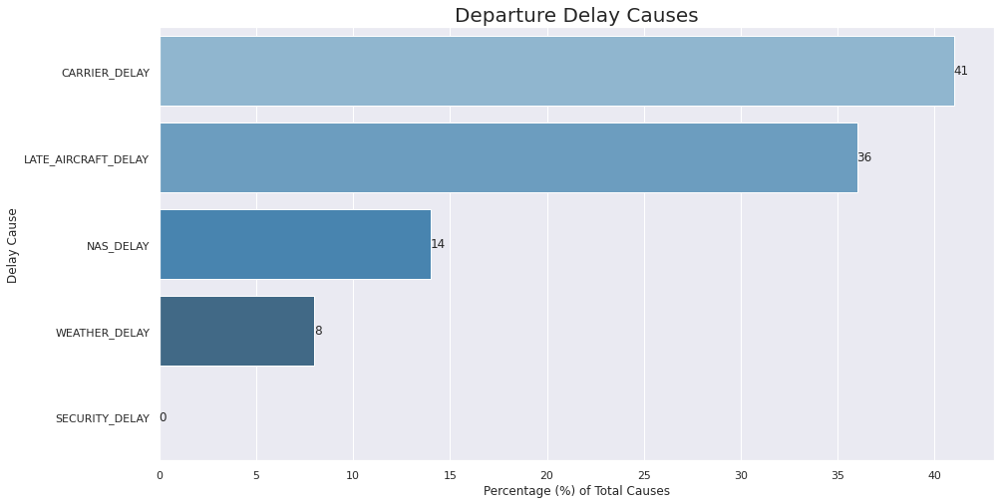

In [0]:
df_del = df_airlines.select('CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY', 'DEP_DEL15').toPandas()
df_del = df_del[(df_del['DEP_DEL15'] ==1)]
col_list= ['CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']

df_del['Sum'] = df_del[col_list].sum(axis=1)
for i in col_list:
  df_del[i] = np.where(np.isnan(df_del[i]), df_del[i] ,df_del[i] / df_del['Sum'] )
  
df_del_sum = df_del.agg(['sum'])
T_df_del_sum = df_del_sum[(col_list)].T

T_df_del_sum['Cause'] = col_list

T_df_del_sum['Percent'] = (T_df_del_sum['sum'] / T_df_del_sum['sum'].sum()) * 100

T_df_del_sum=T_df_del_sum.round(0)

t_df = T_df_del_sum.sort_values(by='sum', ascending=False).reset_index()

sns.set_theme(style="whitegrid")
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.barplot(x="Percent", y="Cause", data=t_df,palette="Blues_d")
ax.set_xlabel("Percentage (%) of Total Causes", fontsize=12)
ax.set_ylabel("Delay Cause", fontsize=12)
ax.set_title('Departure Delay Causes', fontsize=20)
ax.bar_label(ax.containers[0])
plt.show()

####Average delay for busiest airports

In [0]:
df = df_airlines.select('DEP_DELAY', 'ORIGIN_CITY_NAME').groupBy('ORIGIN_CITY_NAME').agg(avg("DEP_DELAY").alias("avg"), count('ORIGIN_CITY_NAME').alias("cnt"))

avg_delays_df = df.sort('cnt').toPandas()

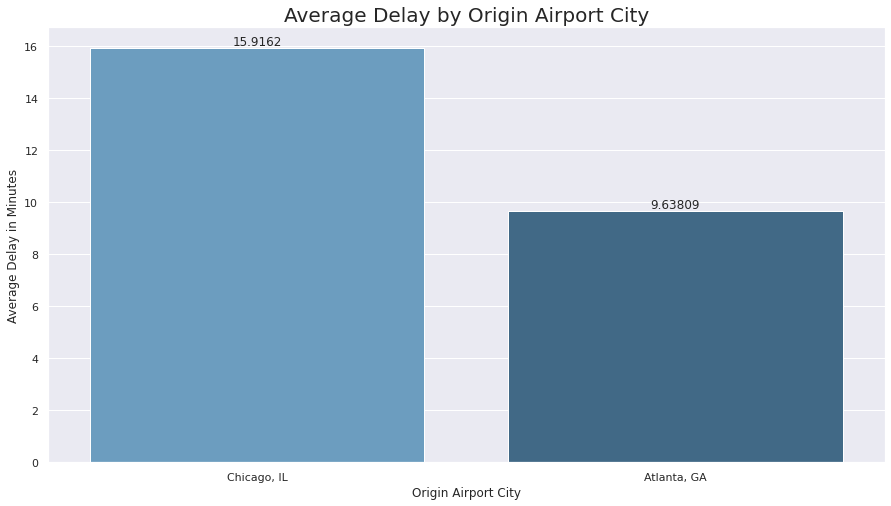

In [0]:
sns.set_theme(style="whitegrid")
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.barplot(x='ORIGIN_CITY_NAME', y='avg', data=avg_delays_df,palette="Blues_d")
ax.set_xlabel("Origin Airport City", fontsize=12)
ax.set_ylabel("Average Delay in Minutes", fontsize=12)
ax.set_title('Average Delay by Origin Airport City', fontsize=20)
ax.bar_label(ax.containers[0])
plt.show()

In [0]:
df = df_weather.select("STATION", "LATITUDE", "LONGITUDE").groupBy("STATION").agg(max("LATITUDE").alias("lat"), max("LONGITUDE").alias("lon")).toPandas()

In [0]:
#df_weather.printSchema()
df1 = df[((df.lat>=24.52) & (df.lat<=49.38) & (df.lon>=-124.77) & (df.lon<=-66.95)) | ((df.lat<=72.5) & (df.lat>=55.3) & (df.lon>=-170.7) & (df.lon<=-132.95))]
df1.head()

Out[48]:

,STATION,lat,lon
1,72220103723,35.58222,-79.10111
3,72639600422,39.05000,-105.51600
12,72616094700,44.57611,-71.17861
13,72312314886,46.15000,-89.21667
14,72251512926,27.68333,-97.28333


In [0]:
airport_weather_ref = spark.read.parquet(f"{blob_url}/airport_weather_ref/*")

In [0]:
df_ref = airport_weather_ref.toPandas()
airport_weather_ref.show(5)

+----------+-----------+------------------+------------------+------+--------+-------------------+----------------+---+
airport_id| station_id| air_lat| air_lon|st_lat| st_lon| dist_km| time_zone|rnk|
+----------+-----------+------------------+------------------+------+--------+-------------------+----------------+---+
 10135|72517014737| 40.652099609375|-75.44080352783203| 40.65| -75.448| 0.6504557811226402|America/New_York| 1|
 10140|72365023050| 35.040199| -106.609001|35.042|-106.616| 0.667916680239816| America/Denver| 1|
 10146|72216013869|31.535499572753906|-84.19450378417969|31.536| -84.194|0.07332103272367636|America/New_York| 1|
 10158|72407093730| 39.45759963989258|-74.57720184326172|39.452| -74.567| 1.0746564033592567|America/New_York| 1|
 10185|74754093915| 31.32740020751953|-92.54979705810547|31.335| -92.559| 1.2157987870024372| America/Chicago| 1|
+----------+-----------+------------------+------------------+------+--------+-------------------+----------------+---+
only showing top 5 rows

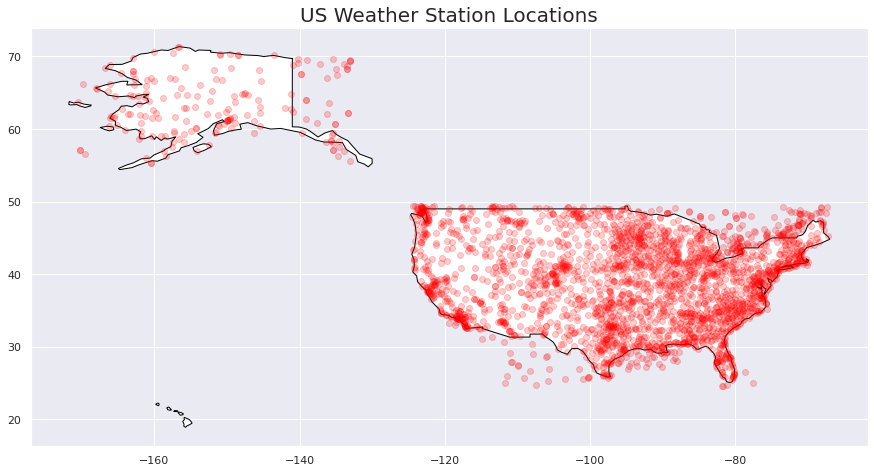

In [0]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt

gdf = geopandas.GeoDataFrame(
    df1, geometry=geopandas.points_from_xy(df1.lon, df1.lat))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

# We restrict to South America.
ax = world[world.name == 'United States of America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, color='red', alpha=0.2)

ax.set_title('US Weather Station Locations', fontsize=20)
plt.show()

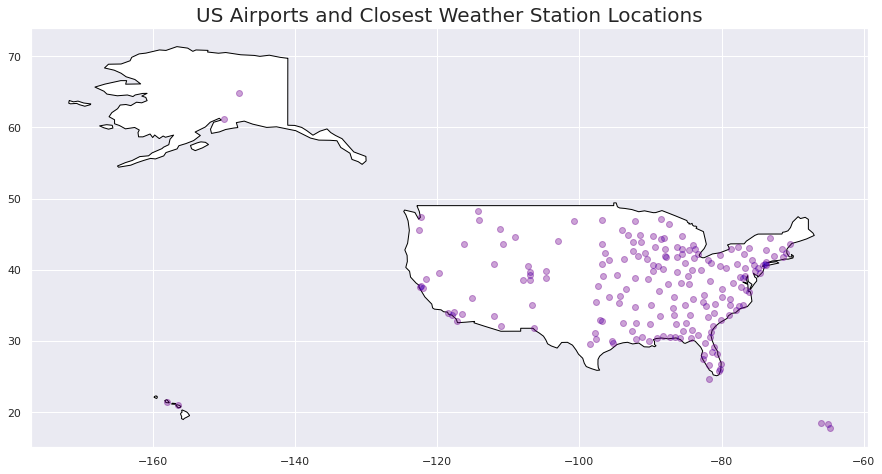

In [0]:
gdf3 = geopandas.GeoDataFrame(
    df_ref, geometry=geopandas.points_from_xy(df_ref.st_lon, df_ref.st_lat))

gdf4 = geopandas.GeoDataFrame(
    df_ref, geometry=geopandas.points_from_xy(df_ref.air_lon, df_ref.air_lat))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

# We restrict to South America.
ax = world[world.name == 'United States of America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf3.plot(ax=ax, color='red', alpha=0.2)
gdf4.plot(ax=ax, color='blue', alpha=0.2)
ax.set_title('US Airports and Closest Weather Station Locations', fontsize=20)
plt.show()

####Barplot of percentages of missing data in 6-month flight data variables - Part 1

Observation: Highest proportion of missing data found in Diversion related data columns.

In [0]:
T_amount_missing_df_airlines = amount_missing_df_airlines.toPandas().T
T_amount_missing_df_airlines = T_amount_missing_df_airlines.reset_index().rename(columns={'index':'var',0:'%missg'}).sort_values('%missg')
T_amount_missing_df_airlines_abvz = T_amount_missing_df_airlines[T_amount_missing_df_airlines['%missg']>0]
T_amount_missing_df_airlines_1 = T_amount_missing_df_airlines_abvz[0:35]
T_amount_missing_df_airlines_2 = T_amount_missing_df_airlines_abvz[36:70]



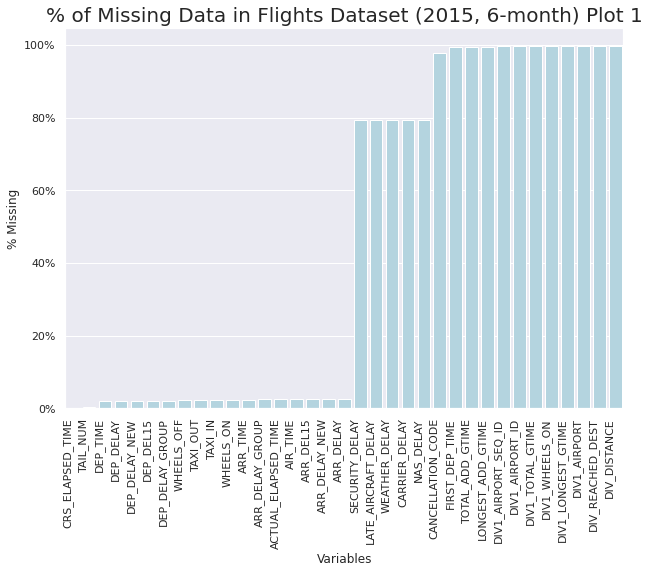

In [0]:


fig, ax = plt.subplots(figsize = (10,7))
ax = sns.barplot(x='var', y='%missg', data=T_amount_missing_df_airlines_1, ax = ax, color="lightblue")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, horizontalalignment='right')
ax.set_title('% of Missing Data in Flights Dataset (2015, 6-month) Plot 1', fontsize=20)
ax.set_xlabel("Variables",fontsize = 12)
ax.set_ylabel("% Missing",fontsize = 12)

ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

plt.show()

Barplot of percentages of missing data in 6-month flight data variables - Part 2

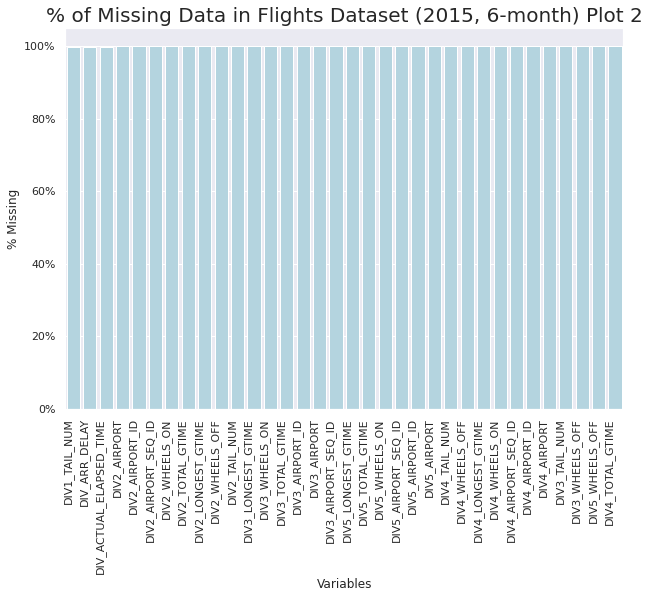

In [0]:
fig, ax = plt.subplots(figsize = (10,7))
ax = sns.barplot(x='var', y='%missg', data=T_amount_missing_df_airlines_2, ax = ax, color="lightblue")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, horizontalalignment='right')
ax.set_title('% of Missing Data in Flights Dataset (2015, 6-month) Plot 2', fontsize=20)
ax.set_xlabel("Variables",fontsize = 12)
ax.set_ylabel("% Missing",fontsize = 12)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.show()

#### Description of Flights Data by Count, Mean, Standard Deviation, Min and Max

Observations : Maximum departure delay was 1,221 minutes.

In [0]:
df_airlines_trimmed.describe()

Out[63]:

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_CARRIER_AIRLINE_ID,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_STATE_FIPS,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST_STATE_FIPS,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,DIV_AIRPORT_LANDINGS
count,337827.0,337827.000000,337827.000000,337827.000000,337827.000000,337827.000000,337827.000000,337827.000000,3.378270e+05,337827.000000,337827.000000,337827.000000,337827.000000,3.378270e+05,337827.000000,337827.000000,337827.000000,337827.000000,330567.000000,330567.000000,330567.000000,330567.000000,330567.000000,330355.000000,330355.000000,330085.000000,330085.000000,337827.000000,330085.000000,329356.000000,329356.00000,329356.000000,329356.000000,337827.000000,337827.000000,337826.000000,329356.000000,329356.000000,337827.0,337827.000000,337827.000000,337827.000000
mean,2015.0,1.523256,3.596521,15.635387,3.918369,20011.600982,2492.061795,11983.397286,1.198344e+06,30657.433180,14.796091,37.143159,12714.199315,1.271422e+06,32020.376497,28.689297,49.107617,1428.284071,1438.265695,12.417915,14.240916,0.223870,0.232358,18.357394,1466.460250,1549.647406,6.115637,1575.524405,1549.776948,6.730595,13.82477,0.212630,-0.047438,0.022322,0.002753,125.632254,120.407173,95.949246,1.0,668.725892,3.149923,0.004630
std,0.0,0.499460,1.701582,8.714826,1.990816,313.524479,1740.446562,1757.297472,1.757288e+05,288.489254,1.989581,3.481767,1526.414611,1.526413e+05,1390.573664,16.062940,21.721594,462.195742,475.890526,37.421297,36.638029,0.416837,2.178133,9.319981,478.887046,510.319148,4.656660,487.849713,517.484736,40.079201,36.63490,0.409169,2.326001,0.147729,0.052396,64.093311,63.484748,61.655515,0.0,482.200928,1.864158,0.139251
min,2015.0,1.000000,1.000000,1.000000,1.000000,19393.000000,3.000000,10397.000000,1.039705e+06,30397.000000,13.000000,34.000000,10135.000000,1.013503e+06,30135.000000,1.000000,1.000000,500.000000,1.000000,-52.000000,0.000000,0.000000,-2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-64.000000,0.00000,0.000000,-2.000000,0.000000,0.000000,37.000000,27.000000,13.000000,1.0,67.000000,1.000000,0.000000
25%,2015.0,1.000000,2.000000,8.000000,2.000000,19790.000000,1165.000000,10397.000000,1.039705e+06,30397.000000,13.000000,34.000000,11292.000000,1.129202e+06,30852.000000,12.000000,33.000000,1025.000000,1026.000000,-3.000000,0.000000,0.000000,-1.000000,13.000000,1042.000000,1144.000000,4.000000,1159.000000,1147.000000,-13.000000,0.00000,0.000000,-1.000000,0.000000,0.000000,82.000000,78.000000,55.000000,1.0,334.000000,2.000000,0.000000
50%,2015.0,2.000000,4.000000,16.000000,4.000000,19805.000000,1975.000000,10397.000000,1.039705e+06,30397.000000,13.000000,34.000000,12892.000000,1.289203e+06,31703.000000,28.000000,43.000000,1426.000000,1442.000000,0.000000,0.000000,0.000000,0.000000,16.000000,1457.000000,1558.000000,5.000000,1611.000000,1600.000000,-4.000000,0.00000,0.000000,-1.000000,0.000000,0.000000,112.000000,106.000000,82.000000,1.0,581.000000,3.000000,0.000000
75%,2015.0,2.000000,5.000000,23.000000,6.000000,20366.000000,3579.000000,13930.000000,1.393003e+06,30977.000000,17.000000,41.000000,14098.000000,1.409803e+06,33184.000000,42.000000,66.000000,1834.000000,1850.000000,12.000000,12.000000,0.000000,0.000000,21.000000,1906.000000,2003.000000,7.000000,2013.000000,2005.000000,10.000000,10.00000,0.000000,0.000000,0.000000,0.000000,143.000000,139.000000,111.000000,1.0,780.000000,4.000000,0.000000
max,2015.0,2.000000,6.000000,31.000000,7.000000,21171.000000,6539.000000,13930.000000,1.393003e+06,30977.000000,17.000000,41.000000,15919.000000,1.591902e+06,35550.000000,78.000000,93.000000,2355.000000,2400.000000,1221.000000,1221.000000,1.000000,12.000000,162.000000,2

In [0]:
df_airlines_delayed = df_airlines_trimmed[(df_airlines_trimmed['DEP_DEL15']>0) & (df_airlines_trimmed['DEP_DELAY']<300)]

#### Box Plot of Departure Delays by Day of Week

Observation: Amongst delayed flights, the median flight delay remained below 50 minutes regardless of day of week, day of month or month.
There are a large number of outliers. Which means some feature scaling in the form of Standardization might be required.
Separately, we note that max delays are higher on Mondays, the 9th day and 24th day of the month and in January or June.
We hypothesize that this may be due to winter storms in January of summer rainstorms in June.

Out[60]:

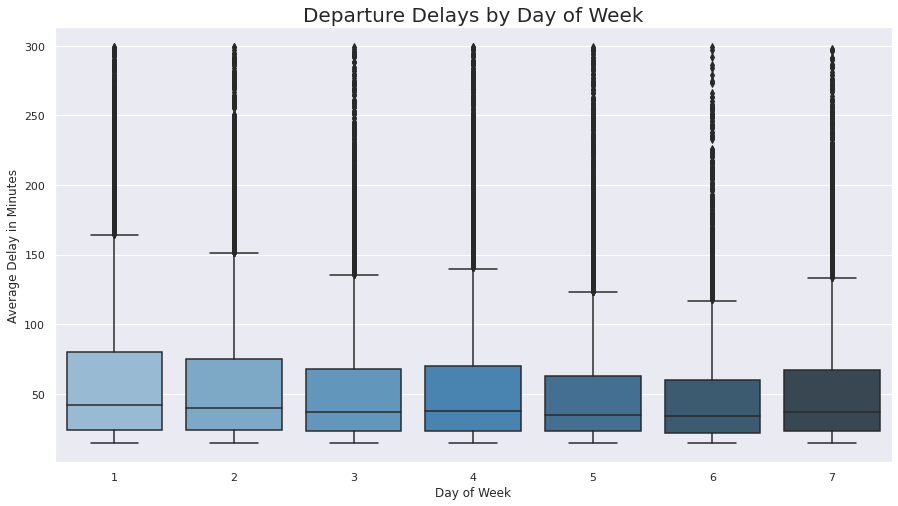

Text(0.5, 1.0, 'Departure Delays by Day of Week')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(x='DAY_OF_WEEK', y='DEP_DELAY', data=df_airlines_delayed,palette="Blues_d")
ax.set_xlabel("Day of Week", fontsize=12)
ax.set_ylabel("Average Delay in Minutes", fontsize=12)
ax.set_title('Departure Delays by Day of Week', fontsize=20)

#sns.boxplot(x='DAY_OF_WEEK', y='DEP_DELAY', data=df_airlines_delayed)

#### Box Plot of Departure Delays by Day of Month

Out[61]:

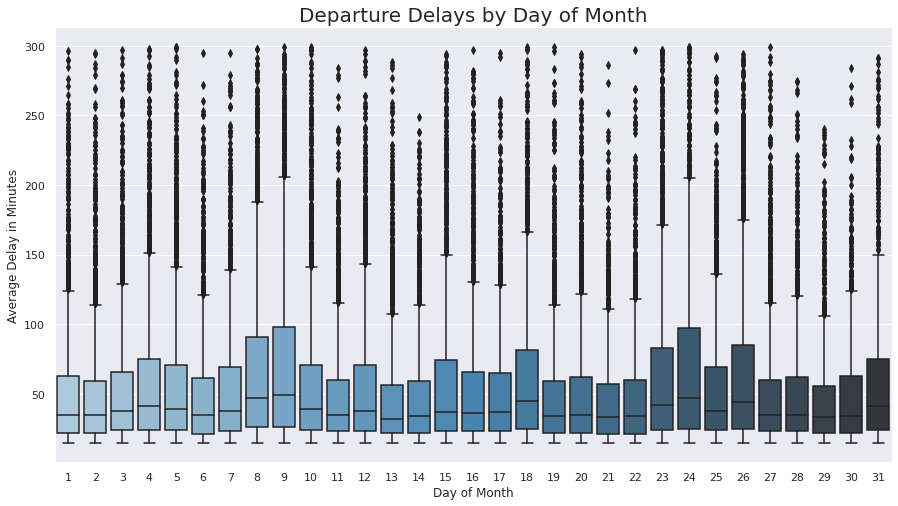

Text(0.5, 1.0, 'Departure Delays by Day of Month')

In [0]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(x='DAY_OF_MONTH', y='DEP_DELAY', data=df_airlines_delayed,palette="Blues_d")
ax.set_xlabel("Day of Month", fontsize=12)
ax.set_ylabel("Average Delay in Minutes", fontsize=12)
ax.set_title('Departure Delays by Day of Month', fontsize=20) 

#sns.boxplot(x='DAY_OF_MONTH', y='DEP_DELAY', data=df_airlines_delayed)

#### Box Plot of Departure Delays by Month

Out[62]:

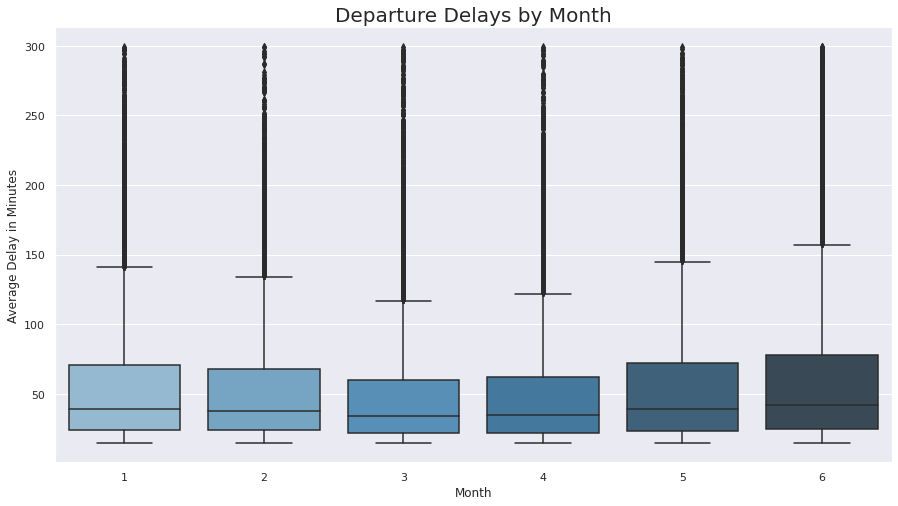

Text(0.5, 1.0, 'Departure Delays by Month')

In [0]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(x='MONTH', y='DEP_DELAY', data=df_airlines_delayed,palette="Blues_d")
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Average Delay in Minutes", fontsize=12)
ax.set_title('Departure Delays by Month', fontsize=20)

#sns.boxplot(x='MONTH', y='DEP_DELAY', data=df_airlines_delayed)

#### Correlation Heatmap for Flights Data

Observation: The correlation heatmap shows that arrival data and departure data are highly correlated. This means some of these variables will need to be dropped to reduce multi-collinearity in our model. Additionally, we need to take care to ensure arrival info which happens after departure or within 2 hours of departure is not included to ensure there is no data-leakage.

In [0]:

df_airlines_trimmed = df_airlines_trimmed[df_airlines_trimmed['CANCELLED'] ==0]

df_airlines_trimmed = df_airlines_trimmed.loc[:, ~df_airlines_trimmed.columns.isin(['CANCELLED','CANCELLATION_CODE','CARRIER_DELAY','WEATHER_DELAY','NAS_DELAY','SECURITY_DELAY','LATE_AIRCRAFT_DELAY', 'ACTUAL_ELAPSED_TIME','CRS_ELAPSED_TIME','AIR_TIME','TAXI_IN','TAXI_OUT','WHEELS_ON','WHEELS_OFF','DIVERTED','OP_UNIQUE_CARRIER', 'ORIGIN_AIRPORT_SEQ_ID','DEST_AIRPORT_SEQ_ID'])]

In [0]:
df_airlines_trimmed= df_airlines_trimmed[df_airlines_trimmed.columns.drop(list(df_airlines_trimmed.filter(regex='DIV')))]

In [0]:
len(df_airlines_trimmed.columns)

Out[67]: 43

In [0]:
display(df_airlines_trimmed)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,FLIGHTS,DISTANCE,DISTANCE_GROUP
2015,2,4,23,4,2015-04-23,19805,AA,N3FJAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202.0,-8.0,0.0,0.0,-1.0,1200-1259,1414,1402.0,-12.0,0.0,0.0,-1.0,1400-1459,1.0,1440.0,6
2015,2,4,24,5,2015-04-24,19805,AA,N3BAAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214.0,4.0,4.0,0.0,0.0,1200-1259,1414,1429.0,15.0,15.0,1.0,1.0,1400-1459,1.0,1440.0,6
2015,2,4,25,6,2015-04-25,19805,AA,N3CUAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254.0,44.0,44.0,1.0,2.0,1200-1259,1414,1445.0,31.0,31.0,1.0,2.0,1400-1459,1.0,1440.0,6
2015,2,4,26,7,2015-04-26,19805,AA,N3HKAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205.0,-5.0,0.0,0.0,-1.0,1200-1259,1414,1330.0,-44.0,0.0,0.0,-2.0,1400-1459,1.0,1440.0,6
2015,2,4,27,1,2015-04-27,19805,AA,N3DMAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1219.0,9.0,9.0,0.0,0.0,1200-1259,1414,1350.0,-24.0,0.0,0.0,-2.0,1400-1459,1.0,1440.0,6
2015,2,4,28,2,2015-04-28,19805,AA,N3BKAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1217.0,7.0,7.0,0.0,0.0,1200-1259,1414,1334.0,-40.0,0.0,0.0,-2.0,1400-1459,1.0,1440.0,6
2015,2,4,29,3,2015-04-29,19805,AA,N3LGAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1206.0,-4.0,0.0,0.0,-1.0,1200-1259,1414,1325.0,-49.0,0.0,0.0,-2.0,1400-1459,1.0,1440.0,6
2015,2,4,30,4,2015-04-30,19805,AA,N3JTAA,165,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1256.0,46.0,46.0,1.0,3.0,1200-1259,1414,1423.0,9.0,9.0,0.0,0.0,1400-1459,1.0,1440.0,6
2015,2,4,1,3,2015-04-01,19805,AA,N4WKAA,168,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14492,34492,RDU,"Raleigh/Durham, NC",NC,37,North Carolina,36,1506,1530.0,24.0,24.0,1.0,1.0,1500-1559,1808,1823.0,15.0,15.0,1.0,1.0,1800-1859,1.0,646.0,3
2015,2,4,2,4,2015-04-02,19805,AA,N467AA,168,13930,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14492,34492,RDU,"Raleigh/Durham, NC",NC,37,North Carolina,36,1506,1518.0,12.0,12.0,0.0,0.0,1500-1559,1808,1820.0,12.0,12.0,0.0,0.0,1800-1859,1.0,646.0,3


In [0]:

corr_cols = []
for i in range(len(df_airlines_trimmed.dtypes)):
  if df_airlines_trimmed.dtypes[i]=='int32' or df_airlines_trimmed.dtypes[i]=='float64':
    corr_cols.append(df_airlines_trimmed.columns[i])

df_airlines_trimmed_num = df_airlines_trimmed[[c for c in df_airlines_trimmed.columns if c in corr_cols]]

In [0]:
len(df_airlines_trimmed_num.columns)

Out[70]: 30

In [0]:
display(df_airlines_trimmed_num)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_CARRIER_AIRLINE_ID,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_STATE_FIPS,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_CITY_MARKET_ID,DEST_STATE_FIPS,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,FLIGHTS,DISTANCE,DISTANCE_GROUP
2015,2,4,23,4,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1202.0,-8.0,0.0,0.0,-1.0,1414,1402.0,-12.0,0.0,0.0,-1.0,1.0,1440.0,6
2015,2,4,24,5,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1214.0,4.0,4.0,0.0,0.0,1414,1429.0,15.0,15.0,1.0,1.0,1.0,1440.0,6
2015,2,4,25,6,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1254.0,44.0,44.0,1.0,2.0,1414,1445.0,31.0,31.0,1.0,2.0,1.0,1440.0,6
2015,2,4,26,7,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1205.0,-5.0,0.0,0.0,-1.0,1414,1330.0,-44.0,0.0,0.0,-2.0,1.0,1440.0,6
2015,2,4,27,1,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1219.0,9.0,9.0,0.0,0.0,1414,1350.0,-24.0,0.0,0.0,-2.0,1.0,1440.0,6
2015,2,4,28,2,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1217.0,7.0,7.0,0.0,0.0,1414,1334.0,-40.0,0.0,0.0,-2.0,1.0,1440.0,6
2015,2,4,29,3,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1206.0,-4.0,0.0,0.0,-1.0,1414,1325.0,-49.0,0.0,0.0,-2.0,1.0,1440.0,6
2015,2,4,30,4,19805,165,13930,30977,17,41,14107,30466,4,81,1210,1256.0,46.0,46.0,1.0,3.0,1414,1423.0,9.0,9.0,0.0,0.0,1.0,1440.0,6
2015,2,4,1,3,19805,168,13930,30977,17,41,14492,34492,37,36,1506,1530.0,24.0,24.0,1.0,1.0,1808,1823.0,15.0,15.0,1.0,1.0,1.0,646.0,3
2015,2,4,2,4,19805,168,13930,30977,17,41,14492,34492,37,36,1506,1518.0,12.0,12.0,0.0,0.0,1808,1820.0,12.0,12.0,0.0,0.0,1.0,646.0,3


In [0]:
# plt.figure()
# sns.set(rc = {'figure.figsize':(25,15)})
# corr = df_airlines_trimmed_num.corr()
# ax = sns.heatmap(corr, annot=True)
# plt.title('Correlation matrix ',fontsize=20)


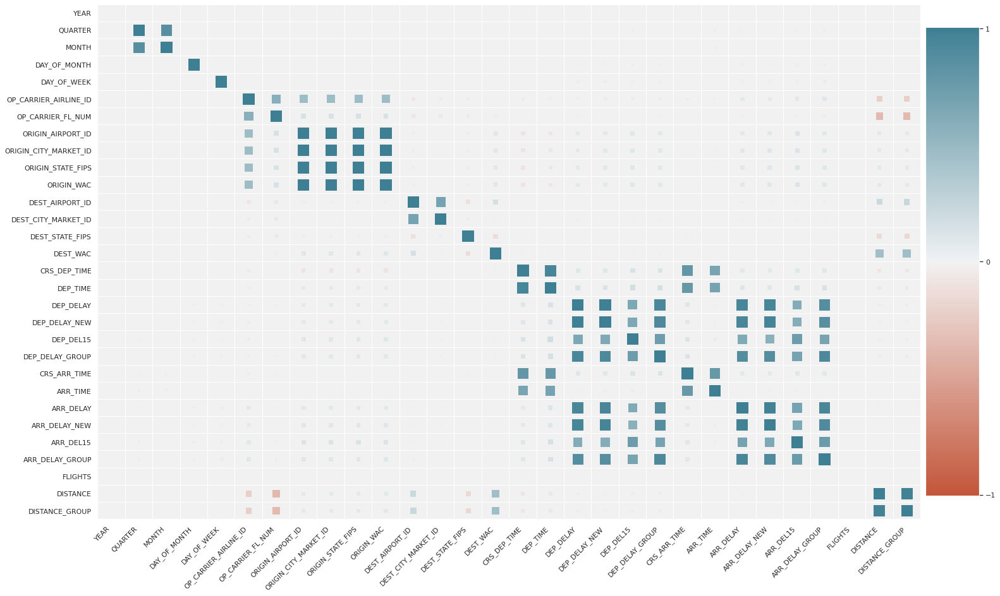

In [0]:

plt.figure(figsize=(25, 15))
corrplot(df_airlines_trimmed_num.corr(), size_scale=300)


#### GraphFrames

References:
- https://databricks.com/blog/2016/03/16/on-time-flight-performance-with-graphframes-for-apache-spark.html
- https://lamastex.gitbooks.io/scalable-data-science/content/db/week8/15_GraphX/028_OnTimeFlightPerformance.html
- https://lamastex.github.io/scalable-data-science/sds/2/2/db/023_OnTimeFlightPerformance.html

In [0]:
tripVertices = df_airlines.select('ORIGIN').withColumnRenamed("ORIGIN", "id").distinct()

#"OP_CARRIER_FL_NUM"

tripEdges = df_airlines.withColumn("tripid", F.monotonically_increasing_id()).select("tripid", "DEP_DELAY", F.col("ORIGIN").alias('src'), F.col("DEST").alias('dst'), "DEST_CITY_NAME", "DEST_STATE_ABR")
tripEdges.cache()
tripVertices.cache()



Out[84]: DataFrame[id: string]

In [0]:
display(tripVertices)
display(tripEdges)


id
ATL
ORD


tripid,DEP_DELAY,src,dst,DEST_CITY_NAME,DEST_STATE_ABR
0,-8.0,ORD,PHX,"Phoenix, AZ",AZ
1,4.0,ORD,PHX,"Phoenix, AZ",AZ
2,44.0,ORD,PHX,"Phoenix, AZ",AZ
3,-5.0,ORD,PHX,"Phoenix, AZ",AZ
4,9.0,ORD,PHX,"Phoenix, AZ",AZ
5,7.0,ORD,PHX,"Phoenix, AZ",AZ
6,-4.0,ORD,PHX,"Phoenix, AZ",AZ
7,46.0,ORD,PHX,"Phoenix, AZ",AZ
8,24.0,ORD,RDU,"Raleigh/Durham, NC",NC
9,12.0,ORD,RDU,"Raleigh/Durham, NC",NC


In [0]:

tripGraph = GraphFrame(tripVertices, tripEdges)



#####Determine the number of airports and trips.

In [0]:
print('Origin Airports:',tripGraph.vertices.count())
print('Trips:', tripGraph.edges.count())

Origin Airports: 2
Trips: 337827

##### Determine longest delay in this dataset

In [0]:
longestDelay = tripGraph.edges.groupBy().max("DEP_DELAY")
display(longestDelay)

max(DEP_DELAY)
1221.0


##### Determine flights departing ORD that are most likely to have significant delays.

Observation: The top ORD origin-destination delay pair is from Chicago O'Hare Airport to Eagle County Colorado Airport which only has one runway.

In [0]:
ORDDelayedTrips = tripGraph.edges.filter("src == 'ORD' and DEP_DELAY>15").groupBy("src", "dst").avg("DEP_DELAY").sort(desc(avg("DEP_DELAY")))


  
#display(topTrips.sort(desc("count_trips")).head(10))
display(ORDDelayedTrips)

src,dst,avg(DEP_DELAY)
ORD,EGE,129.0
ORD,HDN,92.0
ORD,HNL,81.29411764705883
ORD,OGG,77.7
ORD,JAN,75.24193548387096
ORD,AVL,75.08988764044943
ORD,FAI,75.05882352941177
ORD,RDU,74.8625
ORD,PWM,74.53571428571429
ORD,STT,74.33333333333333


###Determining Airport Ranking using PageRank
There are a large number of flights and connections through these various airports included in this Departure Delay Dataset. Using the pageRank algorithm, Spark iteratively traverses the graph and determines a rough estimate of how important the airport is.

In [0]:
ranks = tripGraph.pageRank(resetProbability=0.15, maxIter=5)
display(ranks.vertices.orderBy(ranks.vertices.pagerank.desc()).limit(20))

id,pagerank
ATL,1.0000000000000004
ORD,0.9999999999999996


Most popular flights (single city hops)
Using the tripGraph, we can quickly determine what are the most popular single city hop flights

In [0]:
topTrips = tripGraph.edges.groupBy("src", "dst").agg(count("tripid").alias("count_trips"))

#### Top 10 Trips (Origin-Destination Pair)

In [0]:
from pyspark.sql.functions import col, desc
display(topTrips.sort(desc("count_trips")).head(10))

src,dst,count_trips
ORD,LGA,5224
ATL,LGA,4545
ATL,MCO,4386
ORD,DFW,4122
ORD,LAX,4109
ATL,FLL,4070
ATL,DFW,3938
ATL,TPA,3742
ORD,SFO,3589
ATL,DCA,3490


#### Bottom 10 Trips (Origin-Destination Pair)

In [0]:
display(topTrips.sort(asc("count_trips")).head(10))

src,dst,count_trips
ATL,OAK,2
ORD,COD,2
ATL,ONT,3
ATL,ELM,4
ATL,MSO,6
ATL,FCA,7
ATL,RAP,7
ATL,TVC,9
ATL,LAN,13
ORD,GUC,15


### Weather Data

Preview weather data

In [0]:
display(df_weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0093,1","00122,1,9,N","006000,1

View weather data schema.

In [0]:
df_weather.printSchema()

root
-- STATION: string (nullable = true)
-- DATE: timestamp (nullable = true)
-- SOURCE: short (nullable = true)
-- LATITUDE: double (nullable = true)
-- LONGITUDE: double (nullable = true)
-- ELEVATION: double (nullable = true)
-- NAME: string (nullable = true)
-- REPORT_TYPE: string (nullable = true)
-- CALL_SIGN: string (nullable = true)
-- QUALITY_CONTROL: string (nullable = true)
-- WND: string (nullable = true)
-- CIG: string (nullable = true)
-- VIS: string (nullable = true)
-- TMP: string (nullable = true)
-- DEW: string (nullable = true)
-- SLP: string (nullable = true)
-- AW1: string (nullable = true)
-- GA1: string (nullable = true)
-- GA2: string (nullable = true)
-- GA3: string (nullable = true)
-- GA4: string (nullable = true)
-- GE1: string (nullable = true)
-- GF1: string (nullable = true)
-- KA1: string (nullable = true)
-- KA2: string (nullable = true)
-- MA1: string (nullable = true)
-- MD1: string (nullable = true)
-- MW1: string (nullable = true)
-- MW2: string (nullable = true)
-- OC1: string (nullable = true)
-- OD1: string (nullable = true)
-- OD2: string (nullable = true)
-- REM: string (nullable = true)
-- EQD: string (nullable = true)
-- AW2: string (nullable = true)
-- AX4: string (nullable = true)
-- GD1: string (nullable = true)
-- AW5: string (nullable = true)
-- GN1: string (nullable = true)
-- AJ1: string (nullable = true)
-- AW3: string (nullable = true)
-- MK1: string (nullable = true)
-- KA4: string (nullable = true)
-- GG3: string (nullable = true)
-- AN1: string (nullable = true)
-- RH1: string (nullable = true)
-- AU5: string (nullable = true)
-- HL1: string (nullable = true)
-- OB1: string (nullable = true)
-- AT8: string (nullable = true)
-- AW7: string (nullable = true)
-- AZ1: string (nullable = true)
-- CH1: string (nullable = true)
-- RH3: string (nullable = true)
-- GK1: string (nullable = true)
-- IB1: string (nullable = true)
-- AX1: string (nullable = true)
-- CT1: string (nullable = true)
-- AK1: string (nullable = true)
-- CN2: string (nullable = true)
-- OE1: string (nullable = true)
-- MW5: string (nullable = true)
-- AO1: string (nullable = true)
-- KA3: string (nullable = true)
-- AA3: string (nullable = true)
-- CR1: string (nullable = true)
-- CF2: string (nullable = true)
-- KB2: string (nullable = true)
-- GM1: string (nullable = true)
-- AT5: string (nullable = true)
-- AY2: string (nullable = true)
-- MW6: string (nullable = true)
-- MG1: string (nullable = true)
-- AH6: string (nullable = true)
-- AU2: string (nullable = true)
-- GD2: string (nullable = true)
-- AW4: string (nullable = true)
-- MF1: string (nullable = true)
-- AA1: string (nullable = true)
-- AH2: string (nullable = true)
-- AH3: string (nullable = true)
-- OE3: string (nullable = true)
-- AT6: string (nullable = true)
-- AL2: string (nullable = true)
-- AL3: string (nullable = true)
-- AX5: string (nullable = true)
-- IB2: string (nullable = true)
-- AI3: string (nullable = true)
-- CV3: string (nullable = true)
-- WA1: string (nullable = true)
-- GH1: string (nullable = true)
-- KF1: string (nullable = true)
-- CU2: string (nullable = true)
-- CT3: string (nullable = true)
-- SA1: string (nullable = true)
-- AU1: string (nullable = true)
-- KD2: string (nullable = true)
-- AI5: string (nullable = true)
-- GO1: string (nullable = true)
-- GD3: string (nullable = true)
-- CG3: string (nullable = true)
-- AI1: string (nullable = true)
-- AL1: string (nullable = true)
-- AW6: string (nullable = true)
-- MW4: string (nullable = true)
-- AX6: string (nullable = true)
-- CV1: string (nullable = true)
-- ME1: string (nullable = true)
-- KC2: string (nullable = true)
-- CN1: string (nullable = true)
-- UA1: string (nullable = true)
-- GD5: string (nullable = true)
-- UG2: string (nullable = true)
-- AT3: string (nullable = true)
-- AT4: string (nullable = true)
-- GJ1: string (nullable = true)
-- MV1: string (nullable = true)
-- GA5: string (nullable = true)
-- CT2: string (nullable = true)
-- CG2: string

There are 177 variables in the weather data but we will only retain and parse to create 13 variables.

In [0]:
len(df_weather.columns)

Out[95]: 177

### Weather Plots

In this section, we explore the weather related features like wind speed, precipitation,visibility, and atmospheric pressure. We look at summary statistics as well as investigate if there appears to be any positive or negative linear relationships between weather features and the outcome variable.

#### Identify unknown/9999 values in the weather data columns.

In [0]:
df_weather_small = df_weather.sample(False,0.001)
display(df_weather_small.filter(col("WND").contains("9999")))
#['STATION','DATE','LONGITUDE','LATITUDE','WND','CIG','VIS','TMP','DEW','SLP','AA1']]

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3839099999,2015-04-07T20:00:00.000+0000,4,50.734444,-3.413889,31.08,"EXETER, UK",FM-12,99999,V020,"999,9,9,9999,9","99999,9,9,9","999999,9,9,9","+0068,5","+0044,5","99999,9",,,,,,,,,,,,,,,,,SYN04603839 46/// ///// 10068 20044 333 553// 20000=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
99999903062,2015-01-03T23:10:00.000+0000,null,35.8584,-106.5214,2656.6,"LOS ALAMOS 13 W, NM US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0016,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0016,1,0,0510,1,0",,,,,"-0016,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0016,1,0",,,,,,,"+02444,1,0",,,,,,,,,,,,,,,,,,"-0016,1,0","+02504,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+02370,1,0",,,,"12460,1,0,29450,1,0",,,,
99999903062,2015-01-06T16:45:00.000+0000,null,35.8584,-106.5214,2656.6,"LOS ALAMOS 13 W, NM US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0017,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0018,1,0,0752,1,0",,,,,"-0015,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0017,1,0",,,,,,,"+02445,1,0",,,,,,,,,,,,,,,,,,"-0017,1,0","+02503,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+02370,1,0",,,,"12470,1,0,29460,1,0",,,,
99999903062,2015-01-08T04:05:00.000+0000,null,35.8584,-106.5214,2656.6,"LOS ALAMOS 13 W, NM US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0024,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0024,1,0,0824,1,0",,,,,"-0024,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0024,1,0",,,,,,,"+02445,1,0",,,,,,,,,,,,,,,,,,"-0024,1,0","+02503,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+02370,1,0",,,,"12850,1,0,29370,1,0",,,,
99999903062,2015-01-12T03:45:00.000+0000,null,35.8584,-106.5214,2656.6,"LOS ALAMOS 13 W, NM US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0039,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0039,1,0,0866,1,0",,,,,"-0040,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0040,1,0",,,,,,,"+02450,1,0",,,,,,,,,,,,,,,,,,"-0039,1,0","+02508,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+02374,1,0",,,,"12810,1,0,29300,1,0",,,,
99999903062,2015-01-12T05:40:00.000+0000,null,35.8584,-106.5214,2656.6,"LOS ALAMOS 13 W, NM US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0042,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0042,1,0,0844,1,0",,,,,"-0042,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0042,1,0",,,,,,,"+02450,1,0",,,,,,,,,,,,,,,,,,"-0041,1,0","+02508,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+02374,1,0",,,,"12850,1,0,29300,1,0",,,,
99999903062,2015-01-20T02:45:00.000+0000,null,35.8584,-106.5214,2656.6,"LOS ALAMOS 13 W, NM US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","+0049,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,+0049,1,0,0402,1,0",,,,,"+0049,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"+0049,1,0",,,,,,,"+02560,1,0",,,,,,,,,,,,,,,

#### Describe count,mean, std deviation and max/min of combined weather and flight data.

In [0]:
airplanes_int = spark.read.parquet(f"{blob_url}/airplanes_weather_joins_intermediate/*")

airplanes_int = airplanes_int.toPandas()

airplanes_int= airplanes_int.apply(lambda col:pd.to_numeric(col, errors='coerce'))

airplanes_int.describe()

Out[97]:

,trip_id,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,depart_date,utc_depart,utc_depart_window,OP_CARRIER_AIRLINE_ID,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,TAIL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_WAC,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,DISTANCE,DISTANCE_GROUP,date_orig,start_time,end_time,wind_speed_mps_orig,ceiling_ht_dim_orig,visibility_meters_orig,temp_cels_orig,dew_pt_orig,atmos_press_orig,precip_hrs_orig,precip_milimeters_orig,date_dest,start_time_dest,end_time_dest,wind_speed_mps_dest,ceiling_ht_dim_dest,visibility_meters_dest,temp_cels_dest,dew_pt_dest,atmos_press_dest,precip_hrs_dest,precip_milimeters_dest
count,3.302860e+05,330286.0,330286.000000,330286.000000,330286.000000,330286.000000,0.0,3.302860e+05,3.302860e+05,3.302860e+05,330286.000000,0.0,330286.000000,330286.000000,0.0,0.0,0.0,0.0,330286.000000,330286.000000,330286.000000,0.0,0.0,0.0,330286.000000,330286.000000,330286.000000,330286.000000,330286.000000,330286.000000,330286.000000,330286.000000,0.0,330286.000000,330085.000000,329356.000000,329356.00000,329356.000000,329356.000000,0.0,330286.000000,330286.000000,0.0,3.302860e+05,3.302860e+05,330263.000000,330263.000000,330263.000000,330263.000000,330263.000000,330263.000000,330263.000000,330263.000000,0.0,3.302860e+05,3.302860e+05,330263.000000,330263.000000,330263.000000,330263.000000,330263.000000,330022.000000,330249.000000,330249.000000
mean,9.795379e+09,2015.0,1.527461,3.608261,15.697123,3.929225,NaN,1.428165e+18,1.428183e+18,1.428172e+18,20008.072652,NaN,2479.882883,11960.357260,NaN,NaN,NaN,NaN,14.770005,37.097509,12718.484447,NaN,NaN,NaN,28.630599,49.183496,1427.156246,1438.136127,12.365589,14.189614,0.223515,0.229368,NaN,1574.355592,1549.776948,6.730595,13.82477,0.212630,-0.047438,NaN,671.516510,3.161121,NaN,1.427428e+18,1.427431e+18,41.852923,10188.212313,1435.713986,122.332599,46.941247,10190.466271,1.001120,1.690062,NaN,1.427428e+18,1.427431e+18,39.811625,11449.466054,1499.141737,138.606709,59.800301,10181.958648,1.063319,1.439680
std,8.859011e+09,0.0,0.499246,1.697791,8.697640,1.984418,NaN,4.479500e+15,4.478127e+15,4.478127e+15,312.969738,NaN,1737.847298,1754.783349,NaN,NaN,NaN,NaN,1.986735,3.476786,1527.361201,NaN,NaN,NaN,16.089673,21.767036,462.166397,475.843090,37.294091,36.510239,0.416601,2.172762,NaN,487.463906,517.484736,40.079201,36.63490,0.409169,2.326001,NaN,483.963432,1.870406,NaN,8.899533e+16,8.899536e+16,23.005636,9422.081125,412.100337,117.004424,115.248150,67.180920,0.074836,13.276090,NaN,8.899533e+16,8.899536e+16,24.385599,9715.621016,1542.785994,117.100129,117.909833,69.028600,1.090588,21.124794
min,0.000000e+00,2015.0,1.000000,1.000000,1.000000,1.000000,NaN,1.420088e+18,1.420109e+18,1.420098e+18,19393.000000,NaN,3.000000,10397.000000,NaN,NaN,NaN,NaN,13.000000,34.000000,10135.000000,NaN,NaN,NaN,1.000000,1.000000,500.000000,1.000000,-52.000000,0.000000,0.000000,-2.000000,NaN,1.000000,1.000000,-64.000000,0.00000,0.000000,-2.000000,NaN,67.000000,1.000000,NaN,-9.223372e+18,-9.223372e+18,0.000000,30.000000,0.000000,-222.000000,-278.000000,9896.000000,1.000000,0.000000,NaN,-9.223372e+18,-9.223372e+18,0.000000,0.000000,0.000000,-289.000000,-333.000000,9801.000000,1.000000,0.000000
25%,8.257125e+04,2015.0,1.000000,2.000000,8.000000,2.000000,NaN,1.424372e+18,1.424391e+18,1.424380e+18,19790.000000,NaN,1163.000000,10397.000000,NaN,NaN,NaN,NaN,13.000000,34.000000,11292.000000,NaN,NaN,NaN,12.000000,33.000000,1025.000000,1026.000000,-3.000000,0.000000,0.000000,-1.000000,NaN,1159.000000,1147.000000,-13.000000,0.00000,0.000000,-1.000000,NaN,334.000000,2.000000,NaN,1.424380e+18,1.424383e+18,26.000000,1128.000000,1609.000000,39.000000,-33.000000,10148.000000,1.000000,0.000000,NaN,1.424380e+18,1.424383e+18,21.000000,1463.000000,1609.000000,56.000

#### Correlation Heatmap for Joined Weather and Flights Data

Observation: It shows that the weather station longitude and latitude is highly correlated with the airports location.
Also, that delays or most closely correlated with arrival data. This makes sense given our research and the fact that arrivals often follow delays or have impact on subsequent departures. 

The correlation between weather data and delays is weak.

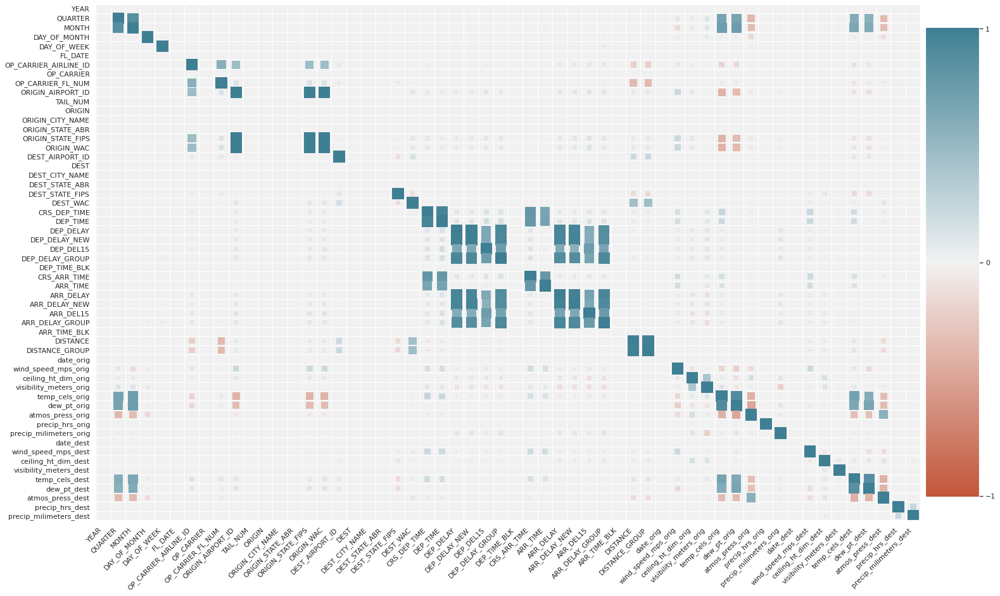

In [0]:

corr_cols_int = []
for i in range(len(airplanes_int.dtypes)):
  if airplanes_int.dtypes[i]=='int32' or airplanes_int.dtypes[i]=='float64':
    corr_cols_int.append(airplanes_int.columns[i])

airplanes_int_num = airplanes_int[[c for c in airplanes_int.columns if c in corr_cols_int]]
plt.figure(figsize=(25, 15))
corrplot(airplanes_int_num.corr(), size_scale=300);


#### Box Plots for Weather Variables against Delays

Observation: Delays are characterized by weather conditions with lower visibility, lower temperatures, less clouds and higher wind speeds.
Other weather variables do not seem to show a significant difference in distribution between delays and non-delays.

In [0]:
# Excluded from table, see EDA from Phase 3 for additional details

# sns.set(style='whitegrid')
# sns.set(rc = {'figure.figsize':(15,8)})
# ax = sns.boxplot(y='wind_angle_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['wind_angle_orig']<500)],palette="Blues_d")
# ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
# ax.set_ylabel("Wind Angle", fontsize=12)
# ax.set_title('Wind Angle vs Delay', fontsize=20) 

#sns.boxplot(y='wind_angle_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['wind_angle_orig']<500)]).set(title='Wind Angle vs Delay')

In [0]:
airplanes_int.columns

Out[156]: Index(['trip_id', 'YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
 'FL_DATE', 'depart_date', 'utc_depart', 'utc_depart_window',
 'OP_CARRIER_AIRLINE_ID', 'OP_CARRIER', 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID', 'TAIL_NUM', 'ORIGIN', 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR', 'ORIGIN_STATE_FIPS', 'ORIGIN_WAC',
 'DEST_AIRPORT_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR',
 'DEST_STATE_FIPS', 'DEST_WAC', 'CRS_DEP_TIME', 'DEP_TIME', 'DEP_DELAY',
 'DEP_DELAY_NEW', 'DEP_DEL15', 'DEP_DELAY_GROUP', 'DEP_TIME_BLK',
 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW', 'ARR_DEL15',
 'ARR_DELAY_GROUP', 'ARR_TIME_BLK', 'DISTANCE', 'DISTANCE_GROUP',
 'date_orig', 'start_time', 'end_time', 'wind_speed_mps_orig',
 'ceiling_ht_dim_orig', 'visibility_meters_orig', 'temp_cels_orig',
 'dew_pt_orig', 'atmos_press_orig', 'precip_hrs_orig',
 'precip_milimeters_orig', 'date_dest', 'start_time_dest',
 'end_time_dest', 'wind_speed_mps_dest', 'ceiling_ht_dim_dest',
 'visibility_meters_dest', 'temp_cels_dest', 'dew_pt_dest',
 'atmos_press_dest', 'precip_hrs_dest', 'precip_milimeters_dest'],
 dtype='object')

Out[157]:

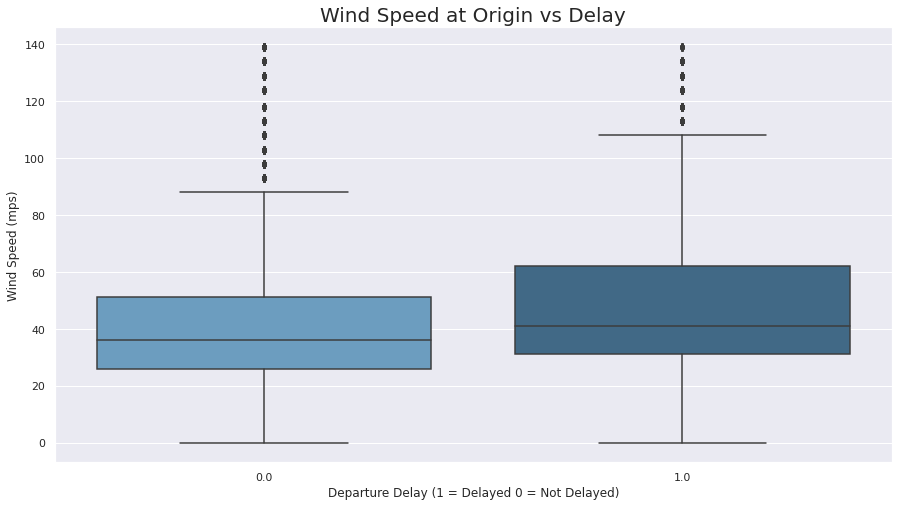

Text(0.5, 1.0, 'Wind Speed at Origin vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='wind_speed_mps_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['wind_speed_mps_orig']<500)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Wind Speed (mps)", fontsize=12)
ax.set_title('Wind Speed at Origin vs Delay', fontsize=20) 

#sns.boxplot(y='wind_speed_mps_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['wind_speed_mps_orig']<500)]).set(title='Wind Speed at Origin vs Delay')

Out[159]:

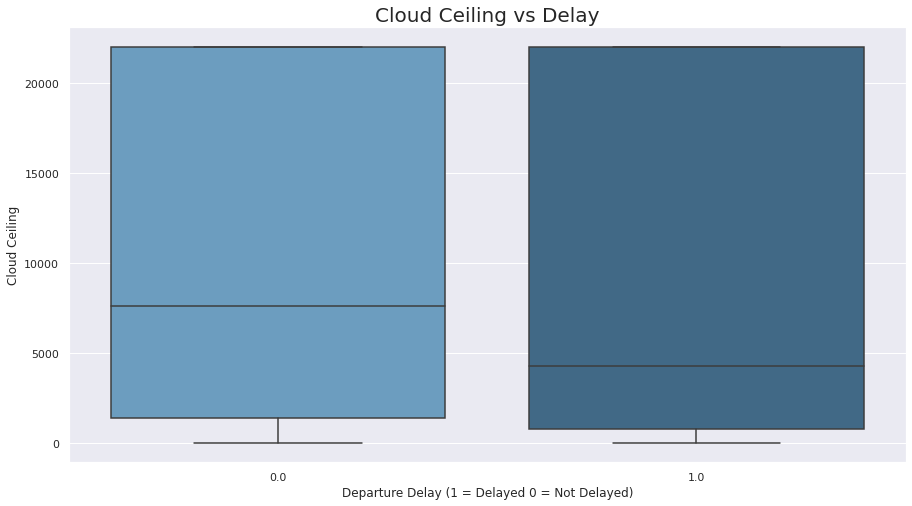

Text(0.5, 1.0, 'Cloud Ceiling vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='ceiling_ht_dim_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['ceiling_ht_dim_orig']<25000)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Cloud Ceiling", fontsize=12)
ax.set_title('Cloud Ceiling vs Delay', fontsize=20) 

#sns.boxplot(y='ceiling_ht_dim_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['ceiling_ht_dim_orig']<25000)]).set(title='Cloud Ceiling vs Delay')

Out[150]:

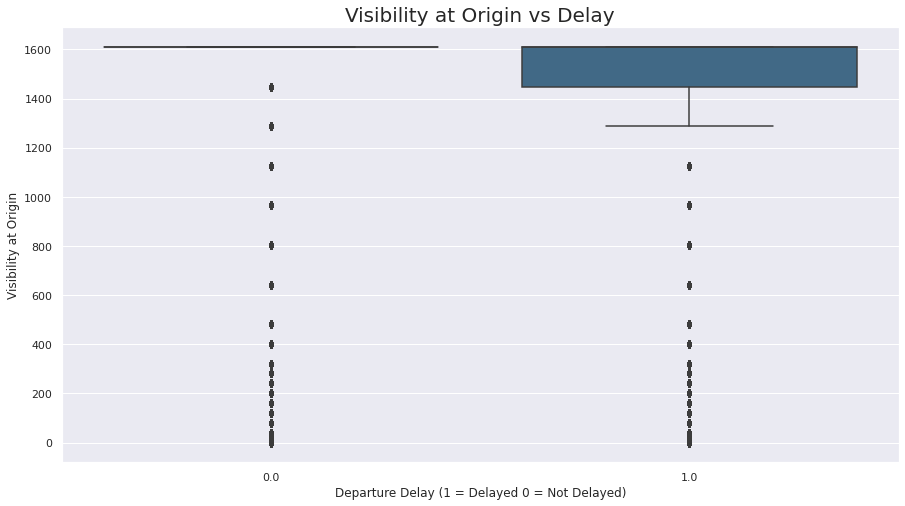

Text(0.5, 1.0, 'Visibility at Origin vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='visibility_meters_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['visibility_meters_orig']<20000)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Visibility at Origin", fontsize=12)
ax.set_title('Visibility at Origin vs Delay', fontsize=20) 
 
#sns.boxplot(y='visibility_meters_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['visibility_meters_orig']<20000)]).set(title='Visibility at Origin vs Delay')

Out[102]:

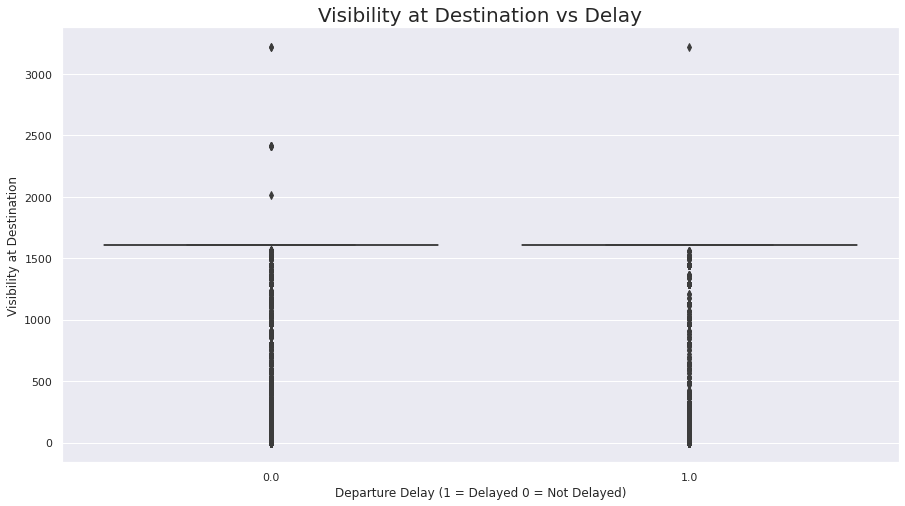

Text(0.5, 1.0, 'Visibility at Destination vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='visibility_meters_dest', x='DEP_DEL15', data=airplanes_int[(airplanes_int['visibility_meters_dest']<5000)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Visibility at Destination", fontsize=12)
ax.set_title('Visibility at Destination vs Delay', fontsize=20) 

#sns.boxplot(y='visibility_meters_dest', x='DEP_DEL15', data=airplanes_int[(airplanes_int['visibility_meters_dest']<5000)]).set(title='Visibility at Destination vs Delay')

Out[101]:

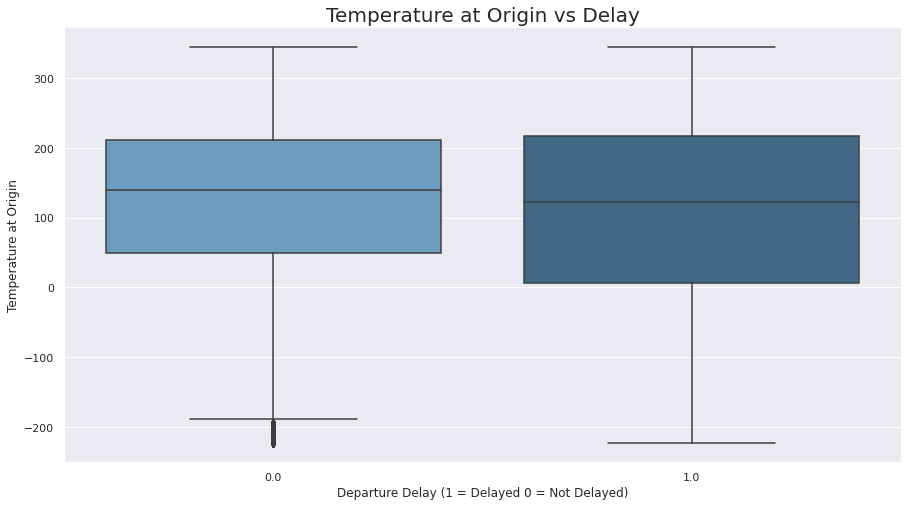

Text(0.5, 1.0, 'Temperature at Origin vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='temp_cels_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['temp_cels_orig']<500)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Temperature at Origin", fontsize=12)
ax.set_title('Temperature at Origin vs Delay', fontsize=20)  

#sns.boxplot(y='temp_cels_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['temp_cels_orig']<500)]).set(title='Temperature at Origin vs Delay')

Out[100]:

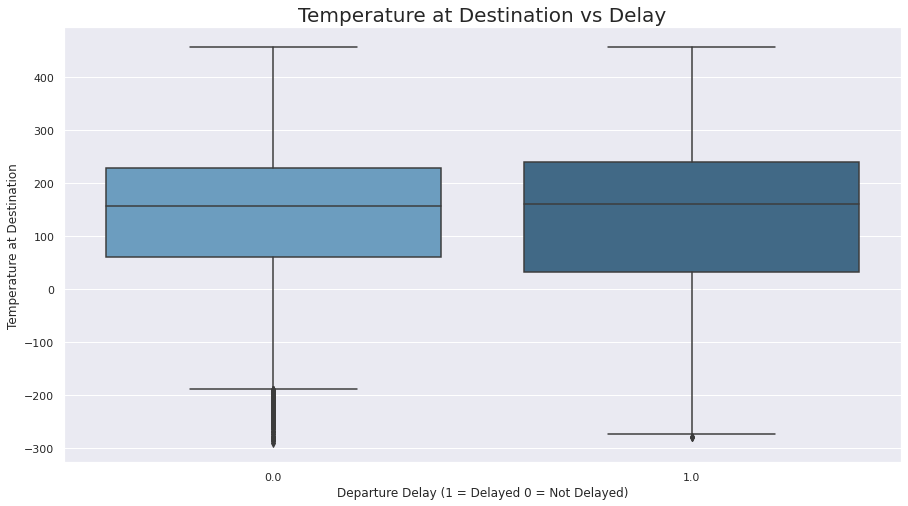

Text(0.5, 1.0, 'Temperature at Destination vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='temp_cels_dest', x='DEP_DEL15', data=airplanes_int[(airplanes_int['temp_cels_dest']<500)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Temperature at Destination", fontsize=12)
ax.set_title('Temperature at Destination vs Delay', fontsize=20)  

#sns.boxplot(y='temp_cels_dest', x='DEP_DEL15', data=airplanes_int[(airplanes_int['temp_cels_dest']<500)]).set(title='Temperature at Destination vs Delay')

Out[106]:

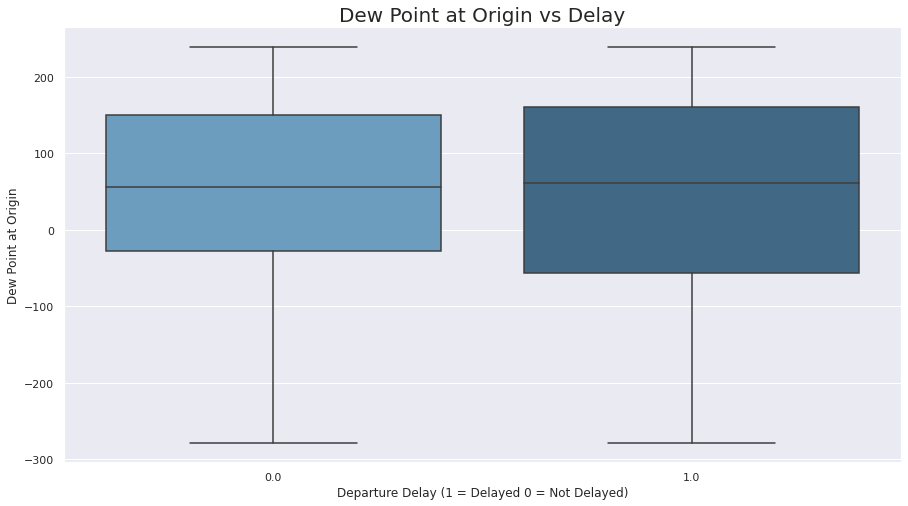

Text(0.5, 1.0, 'Dew Point at Origin vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='dew_pt_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['dew_pt_orig']<1000)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Dew Point at Origin", fontsize=12)
ax.set_title('Dew Point at Origin vs Delay', fontsize=20) 

#sns.boxplot(y='dew_pt_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['dew_pt_orig']<1000)]).set(title='Dew Point at Origin vs Delay')

Out[107]:

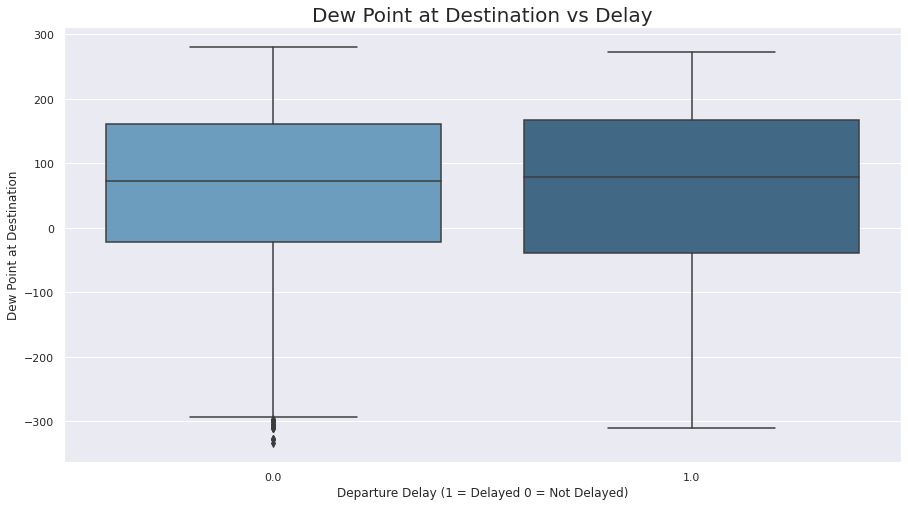

Text(0.5, 1.0, 'Dew Point at Destination vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='dew_pt_dest', x='DEP_DEL15', data=airplanes_int[(airplanes_int['dew_pt_dest']<1000)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Dew Point at Destination", fontsize=12)
ax.set_title('Dew Point at Destination vs Delay', fontsize=20) 

#sns.boxplot(y='dew_pt_dest', x='DEP_DEL15', data=airplanes_int[(airplanes_int['dew_pt_dest']<1000)]).set(title='Dew Point at Destination vs Delay')

Out[109]:

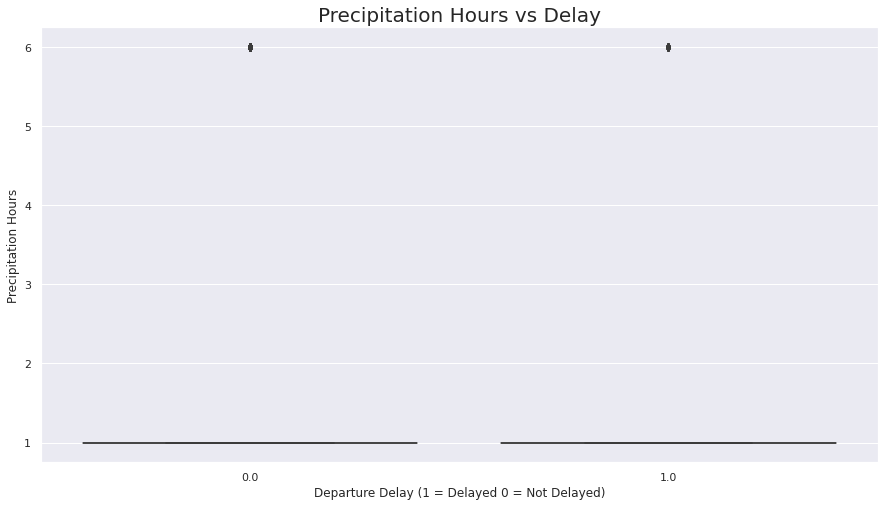

Text(0.5, 1.0, 'Precipitation Hours vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='precip_hrs_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['precip_hrs_orig']<25)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Precipitation Hours", fontsize=12)
ax.set_title('Precipitation Hours vs Delay', fontsize=20) 


#sns.boxplot(y='precip_hrs_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['precip_hrs_orig']<25)]).set(title='Precipitation Hours vs Delay')

Out[111]:

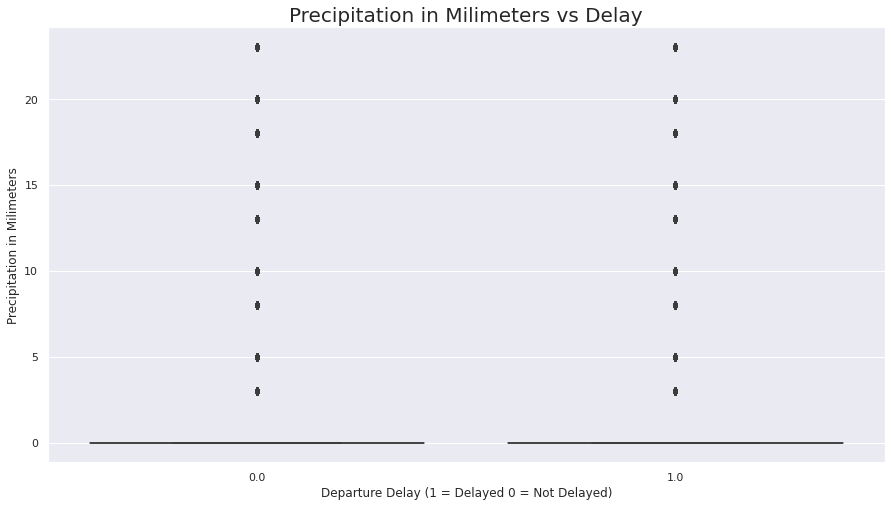

Text(0.5, 1.0, 'Precipitation in Milimeters vs Delay')

In [0]:


sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(y='precip_milimeters_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['precip_milimeters_orig']<25)],palette="Blues_d")
ax.set_xlabel("Departure Delay (1 = Delayed 0 = Not Delayed)", fontsize=12)
ax.set_ylabel("Precipitation in Milimeters", fontsize=12)
ax.set_title('Precipitation in Milimeters vs Delay', fontsize=20)  


#sns.boxplot(y='precip_milimeters_orig', x='DEP_DEL15', data=airplanes_int[(airplanes_int['precip_milimeters_orig']<25)]).set(title='Precipitation in Milimeters vs Delay')

### Stations Data

The data here is primarily used to facilitate weather stations data joins with flight data.

Preview the station data

In [0]:
display(df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


Check how many data variables are in the station data.

In [0]:
len(df_stations.columns)

Out[113]: 12

Print data schema for stations.

In [0]:
df_stations.printSchema()

root
-- usaf: string (nullable = true)
-- wban: string (nullable = true)
-- station_id: string (nullable = true)
-- lat: double (nullable = true)
-- lon: double (nullable = true)
-- neighbor_id: string (nullable = true)
-- neighbor_name: string (nullable = true)
-- neighbor_state: string (nullable = true)
-- neighbor_call: string (nullable = true)
-- neighbor_lat: double (nullable = true)
-- neighbor_lon: double (nullable = true)
-- distance_to_neighbor: double (nullable = true)

Check if any missing data in station columns. Conclusion that there are none.

In [0]:
amount_missing_df_stations = df_stations.select([(count(when(isnan(c) | col(c).isNull(), c))/count(lit(1))).alias(c) for c in df_stations.columns])
display(amount_missing_df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
columns_st = amount_missing_df_stations.columns
amdfs =amount_missing_df_stations.head(1)[0]
columns_to_drop_stations = []

for i in range(len(amdfs)):
  if amdfs[i] > 0.5:
    columns_to_drop_stations.appendm(columns_st[i])
    
columns_to_drop_stations

Out[116]: []

#### Missing Values Exploration (Weather Data)

In this part of the EDA we dive deeper into understanding what weather related data values are missing and why they are missing.

In particular we will explore the weather stations with the most missing data, and the different elements of why the data might be missing.


The key findings for missing weather data were as follows:


1. The Weather Stations subjected to Quality Control V03 had fewer missing values that the Weather Stations that had automated quality control V02.
2. A 2% of Weather Stations at smaller airports account for 37% of the overall missing values (excluding both wind angle and atmopseric pressure metrics from being considered missing). Note: the Wind Angle values are missing when the Wind Speed is equal to 0 and the atmospheric pressure is not a mandatory field required by the FM-15 Metar Aviation Routine Weather Report.
3. We did not find a difference in terms of weather data availability based on the hour of the day.


See queries below for additional details.

In [0]:
df_weather.registerTempTable("weather_tble")

In [0]:
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")
df_stations.registerTempTable("stations")

In [0]:
# Sanity Check: to see if this airport station id exists as a neighbor
test = spark.sql("""select distinct neighbor_id as station_id, 
neighbor_name as name, 
neighbor_state as state, 
neighbor_call as call,
neighbor_lat as lat, 
neighbor_lon as lon  
from stations
where neighbor_id = 'A0002163884'""").display()


station_id,name,state,call,lat,lon
A0002163884,KEE FIELD AIRPORT,WV,KI16,37.601,-81.559


In [0]:
# flag missing weather data for weather related fields we are interested in 
missing_weather = spark.sql("""select  station,
                               quality_control,
                               report_type,
                               date,
							   to_date(date) as date1,
							   hour(date) as start_hr,
						       latitude,
							   longitude,
                               right(WND, 1) as wind_quality_code,
							   case when left(WND,3)= 999 then 1 else 0 end as wind_angle,
							   case when substr(WND,9,4) = 9999 then 1 else 0 end as wind_speed_mps,
                               substr(CIG,7,1) as ceiling_quality,
							   case when left(CIG,5) = 99999 then 1 else 0 end as ceiling_ht_dim, 
                               right(VIS,1) as visibility_quality,
							   case when left(VIS,5) = 999999 then 1 else 0 end as visibility_meters, 
                               right(TMP,1) as temp_quality,
							   case when left(TMP,5) = 9999 then 1 else 0 end as temp_cels,
                               right(DEW,1) as dew_quality,
							   case when left(DEW,5)= 9999 then 1 else 0 end as dew_pt,
                               right(SLP,1) as atmos_quality,
							   case when left(SLP,5) = 99999 then 1 else 0 end as atmos_press,
                               right(AA1,1) as precip_quality,
                               substr(AA1,7,1) as precip_condition_code,
							   case when left(AA1,2) =99 then 1 else 0 end as precip_hrs,
							   case when substr(AA1,4,4) = 9999 then 1 else 0 end as precip_milimeters
					from weather_tble
                    where report_type='FM-15'
					""").cache()


In [0]:
# show spark dataframe
missing_weather.display()

station,quality_control,report_type,date,date1,start_hr,latitude,longitude,wind_quality_code,wind_angle,wind_speed_mps,ceiling_quality,ceiling_ht_dim,visibility_quality,visibility_meters,temp_quality,temp_cels,dew_quality,dew_pt,atmos_quality,atmos_press,precip_quality,precip_condition_code,precip_hrs,precip_milimeters
3809099999,V020,FM-15,2015-01-01T00:50:00.000+0000,2015-01-01,0,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T01:50:00.000+0000,2015-01-01,1,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T02:50:00.000+0000,2015-01-01,2,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T03:50:00.000+0000,2015-01-01,3,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T04:50:00.000+0000,2015-01-01,4,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T05:50:00.000+0000,2015-01-01,5,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T06:50:00.000+0000,2015-01-01,6,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T07:50:00.000+0000,2015-01-01,7,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T08:50:00.000+0000,2015-01-01,8,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T09:50:00.000+0000,2015-01-01,9,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0


In [0]:
missing_weather.registerTempTable("missing_weather2")

In [0]:
spark.sql("refresh missing_weather2")

Out[123]: DataFrame[]

In [0]:
# Verify temp table is working
spark.sql("select * from missing_weather2 limit 10;").display()

station,quality_control,report_type,date,date1,start_hr,latitude,longitude,wind_quality_code,wind_angle,wind_speed_mps,ceiling_quality,ceiling_ht_dim,visibility_quality,visibility_meters,temp_quality,temp_cels,dew_quality,dew_pt,atmos_quality,atmos_press,precip_quality,precip_condition_code,precip_hrs,precip_milimeters
3809099999,V020,FM-15,2015-01-01T00:50:00.000+0000,2015-01-01,0,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T01:50:00.000+0000,2015-01-01,1,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T02:50:00.000+0000,2015-01-01,2,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T03:50:00.000+0000,2015-01-01,3,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T04:50:00.000+0000,2015-01-01,4,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T05:50:00.000+0000,2015-01-01,5,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T06:50:00.000+0000,2015-01-01,6,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T07:50:00.000+0000,2015-01-01,7,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T08:50:00.000+0000,2015-01-01,8,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0
3809099999,V020,FM-15,2015-01-01T09:50:00.000+0000,2015-01-01,9,50.086092,-5.255711,1,0,0,1,0,9,0,1,0,1,0,9,1,,,0,0


In [0]:
# missing values by station
missing_values_by_station = spark.sql("""select station,
                                               quality_control,
                                               name,
                                               state,
                                               lat,
                                               lon,
                                               sum(wind_angle) as wind_angle,
                                               sum(wind_speed_mps) as wind_speed_mps,
                                               sum(ceiling_ht_dim) as ceiling_ht_dim,
                                               sum(visibility_meters)as visibility_meters,
                                               sum(temp_cels) as temp_cels,
                                               sum(dew_pt) as dew_pt,
                                               sum(atmos_press) as atmos_press,
                                               sum(precip_hrs) as precip_hrs,
                                               sum(precip_milimeters) as precip_milimeters
                                         from missing_weather2 t1
                                         inner join (select distinct neighbor_id as station_id, 
                                                                    neighbor_name as name, 
                                                                    neighbor_state as state, 
                                                                    neighbor_call as call,
                                                                    neighbor_lat as lat, 
                                                                    neighbor_lon as lon  
                                                                    from stations) t2 on t1.station=t2.station_id
                                         group by station,quality_control, name,state, lat, lon """).cache()



In [0]:
# Total missing values by station
missing_values_by_station.registerTempTable("missing_values_by_station")

summary_missing_stat = spark.sql("""select station,
                                    quality_control,
                                    name,
                                    state,
                                    lat,
                                    lon,
                    wind_speed_mps +ceiling_ht_dim +visibility_meters +temp_cels + dew_pt +atmos_press +precip_hrs +precip_milimeters as total_no_angle, 
                    wind_speed_mps +ceiling_ht_dim +visibility_meters +temp_cels + dew_pt +precip_hrs +precip_milimeters as total_no_pressure_angle
              from missing_values_by_station
              where station in (select distinct station_id from stations)""").cache()


In [0]:
# average total missing values by station and quality control type
summary_missing_stat.groupby("quality_control").agg(avg("total_no_angle").alias('avg_total_no_angle'), \
                                                    avg("total_no_pressure_angle").alias('avg_total_no_pressure_angle'), \
                                                    count("station").alias('number_of_stations')).display()

quality_control,avg_total_no_angle,avg_total_no_pressure_angle,number_of_stations
V020,6230.494696239151,486.7999035679846,2074
V030,126.01077586206897,100.03448275862068,464


In [0]:
# display table
missing_values_by_station.display()

station,quality_control,name,state,lat,lon,wind_angle,wind_speed_mps,ceiling_ht_dim,visibility_meters,temp_cels,dew_pt,atmos_press,precip_hrs,precip_milimeters
70104526649,V020,RED DOG AIRPORT,AK,68.031,-162.903,131,3,6,0,6,14,1111,0,0
72074924255,V020,WHIDBEY ISLAND NAS,WA,48.35,-122.667,549,1,3,0,2,0,2,0,0
72090400299,V020,DELAND MUNICIPAL AIRPORT SIDN,FL,29.067,-81.283,2788,17,8237,0,6161,6161,12728,0,0
72213653883,V020,BRUNSWICK GOLDEN ISLES APT,GA,31.259,-81.466,3263,0,222,0,1,4,12773,0,0
72455013947,V020,MARSHALL ARMY AIRFIELD,KS,39.05,-96.767,640,4,17,0,14,14,2404,0,109
72637594817,V020,OAKLAND CO. INTNL AIRPORT,MI,42.665,-83.418,517,3,2,0,3,3,33,0,7
72744904954,V020,MOOSE LAKE CARLTON CO ARPT,MN,46.419,-92.804,5084,2,18,0,3,4,12791,0,0
70231026510,V030,MC GRATH AIRPORT,AK,62.957,-155.61,1811,3,0,0,0,138,1,0,0
70231026510,V020,MC GRATH AIRPORT,AK,62.957,-155.61,0,0,0,0,0,0,0,0,0
70362025335,V030,SKAGWAY AIRPORT,AK,59.456,-135.324,1038,19,6,0,1,1,0,0,0


In [0]:
# Missing values for every weather metric we are interested by quality code
missing_wind_values = spark.sql("""select wind_quality_code as quality,
                                               sum(wind_angle) as wind_angle,
                                               sum(wind_speed_mps) as wind_speed_mps
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by wind_quality_code
                                         order by wind_quality_code """).toPandas()

missing_ceiling_values = spark.sql(""" select ceiling_quality as quality,
                                         sum(ceiling_ht_dim) as ceiling_ht_dim
                                         from missing_weather2
                                         where station in (select distinct station_id from stations)
                                         group by ceiling_quality
                                         order by ceiling_quality """).toPandas()

missing_visibility_values = spark.sql("""select visibility_quality as quality,
                                               sum(visibility_meters)as visibility_meters
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by visibility_quality 
                                         order by visibility_quality""").toPandas()

missing_temp_values = spark.sql("""select temp_quality as quality,
                                               sum(temp_cels) as temp_cels
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by temp_quality
                                         order by temp_quality""").toPandas()

missing_dew_values = spark.sql("""select dew_quality as quality,
                                               sum(dew_pt) as dew_pt
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by dew_quality 
                                         order by dew_quality """).toPandas()

missing_atmos_values = spark.sql("""select atmos_quality as quality,
                                               sum(atmos_press) as atmos_press
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by atmos_quality
                                         order by atmos_quality""").toPandas()

missing_precip_values = spark.sql("""select precip_quality as quality,
                                               sum(precip_hrs) as precip_hrs,
                                               sum(precip_milimeters) as precip_milimeters
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by precip_quality
                                         order by precip_quality""").toPandas()
# Creating summary table of missing values by quality code
summary_missing = pd.merge(missing_wind_values,missing_ceiling_values, on='quality', how='left')
summary_missing = pd.merge(summary_missing,missing_visibility_values, on='quality', how='left' )
summary_missing = pd.merge(summary_missing,missing_temp_values, on='quality', how='left')
summary_missing = pd.merge(summary_missing,missing_dew_values, on='quality', how='left' )
summary_missing = pd.merge(summary_missing,missing_atmos_values, on='quality', how='left')
summary_missing = pd.merge(summary_missing,missing_precip_values, on='quality', how='left' )

summary_missing


Out[129]:

,quality,wind_angle,wind_speed_mps,ceiling_ht_dim,visibility_meters,temp_cels,dew_pt,atmos_press,precip_hrs,precip_milimeters
0,1,96824,0,0.0,NaN,0.0,0.0,0.0,0.0,0.0
1,2,0,0,NaN,NaN,0.0,0.0,0.0,0.0,0.0
2,5,3303454,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6,972,0,0.0,NaN,0.0,0.0,0.0,0.0,0.0
4,7,66,0,0.0,NaN,0.0,0.0,NaN,0.0,2.0
5,9,198265,198612,434460.0,0.0,173869.0,246804.0,11924476.0,0.0,2292.0
6,A,27,0,NaN,0.0,0.0,0.0,NaN,NaN,NaN
7,I,9,0,NaN,NaN,0.0,0.0,NaN,0.0,0.0
8,P,107,0,NaN,NaN,0.0,0.0,NaN,0.0,0.0
9,U,10,0,NaN,NaN,NaN,NaN,NaN,0.0,0.0


In [0]:
# Fill NA for final summary table of missing values by quality code
summary_missing.fillna(0)

Out[130]:

,quality,wind_angle,wind_speed_mps,ceiling_ht_dim,visibility_meters,temp_cels,dew_pt,atmos_press,precip_hrs,precip_milimeters
0,1,96824,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5,3303454,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6,972,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7,66,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
5,9,198265,198612,434460.0,0.0,173869.0,246804.0,11924476.0,0.0,2292.0
6,A,27,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,I,9,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,P,107,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,U,10,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
missing_values_by_hr = spark.sql("""select start_hr,
                                               sum(wind_angle) as wind_angle,
                                               sum(wind_speed_mps) as wind_speed_mps,
                                               sum(ceiling_ht_dim) as ceiling_ht_dim,
                                               sum(visibility_meters)as visibility_meters,
                                               sum(temp_cels) as temp_cels,
                                               sum(dew_pt) as dew_pt,
                                               sum(atmos_press) as atmos_press,
                                               sum(precip_hrs) as precip_hrs,
                                               sum(precip_milimeters) as precip_milimeters,
                                               count(station) as num_stations
                                         from missing_weather2 
                                         where station in (select distinct station_id from stations)
                                         group by start_hr 
                                         order by start_hr""").toPandas()

missing_values_by_hr

Out[131]:

,start_hr,wind_angle,wind_speed_mps,ceiling_ht_dim,visibility_meters,temp_cels,dew_pt,atmos_press,precip_hrs,precip_milimeters,num_stations
0,0,133677,7828,17190,0,6796,9068,492384,0,4,685906
1,1,153200,7745,17702,0,6877,9320,494869,0,4,688212
2,2,167107,7865,18273,0,6992,9643,501685,0,4,694647
3,3,175820,7812,18301,0,7169,10036,500718,0,4,693606
4,4,183701,7944,18661,0,7350,10448,500694,0,4,693466
5,5,189181,8052,18867,0,7444,10733,502409,0,5,695368
6,6,196694,8067,19116,0,7614,11156,504099,0,6,697118
7,7,201739,8091,19150,0,7682,11430,504024,0,6,697086
8,8,204787,8056,19327,0,7776,11708,504085,0,6,697267
9,9,209258,8151,19412,0,7840,11997,508360,0,7,701648


### Final Joined Dataset (Seasonality & Airline Performance)

In this section, we explore the final joined dataset. In particular we are looking for seasonality in delays by month and time of day, and looking into whether there are delay differences across airlines. See plots below for additional details.

In [0]:
flights = spark.read.parquet(f"{blob_url}/airplanes_weather_final_5yr_EZ/*").cache()

In [0]:
flights.registerTempTable("final_df")

In [0]:
annual_avg_delays = spark.sql("""select YEAR, 
                                        MONTH, 
                                        AVG(DEP_DEL15) as proportion_delayed_flights,
                                        AVG(DEP_DELAY_NEW) as avg_delay_mins
                                 from final_df
                                 group by YEAR, MONTH
                                        """).cache()

In [0]:
yearly_delays = annual_avg_delays.toPandas()

Out[136]:

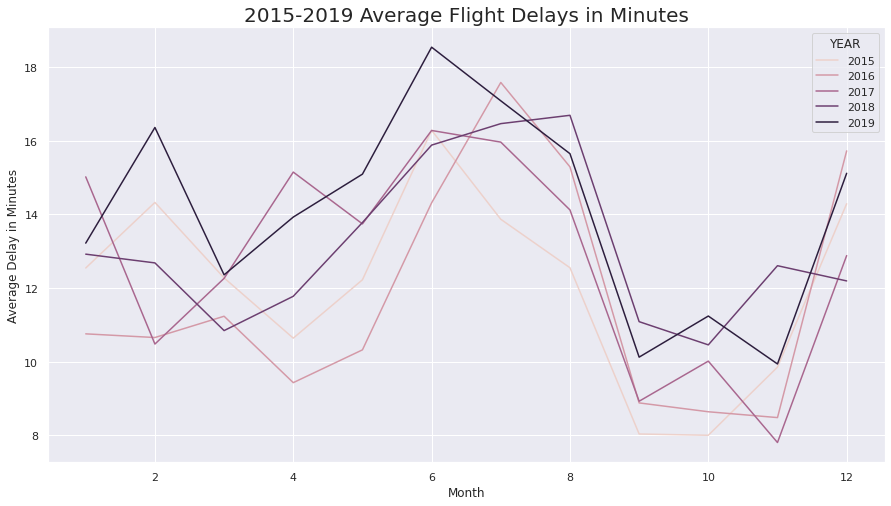

Text(0.5, 1.0, '2015-2019 Average Flight Delays in Minutes')

In [0]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.lineplot(data=yearly_delays, x="MONTH", y="avg_delay_mins",hue='YEAR')
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Average Delay in Minutes", fontsize=12)
ax.set_title('2015-2019 Average Flight Delays in Minutes', fontsize=20) 
# set(title='2015-2019 Average Flight Delays in Minutes', xlabel = "Month", ylabel = "Average Delay in Minutes")

Out[137]:

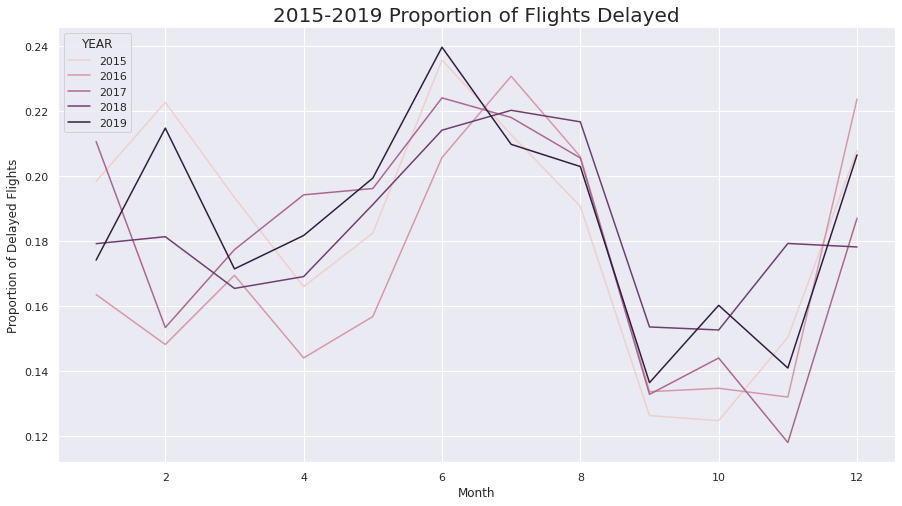

Text(0.5, 1.0, '2015-2019 Proportion of Flights Delayed')

In [0]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.lineplot(data=yearly_delays, x="MONTH", y="proportion_delayed_flights",hue='YEAR')
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Proportion of Delayed Flights", fontsize=12)
ax.set_title('2015-2019 Proportion of Flights Delayed', fontsize=20)
#sns.lineplot(data=yearly_delays, x="MONTH", y="proportion_delayed_flights",hue='YEAR').set(title='2015-2019 Proportion of Flights Delayed', xlabel = "Month", ylabel = "Proportion of Delayed Flights")

In [0]:
time_of_day_flight_delays = spark.sql("""select
                                          DEPARTURE_Hour_CRS as depart_hour, 
                                          AVG(DEP_DEL15) as proportion_delayed_flights,
                                          AVG(DEP_DELAY_NEW) as avg_delay_mins
                                   from final_df
                                   group by  DEPARTURE_Hour_CRS
                                   order by int(DEPARTURE_Hour_CRS)
                                          """).cache()

In [0]:
delays_hourly = time_of_day_flight_delays.toPandas()

Out[161]:

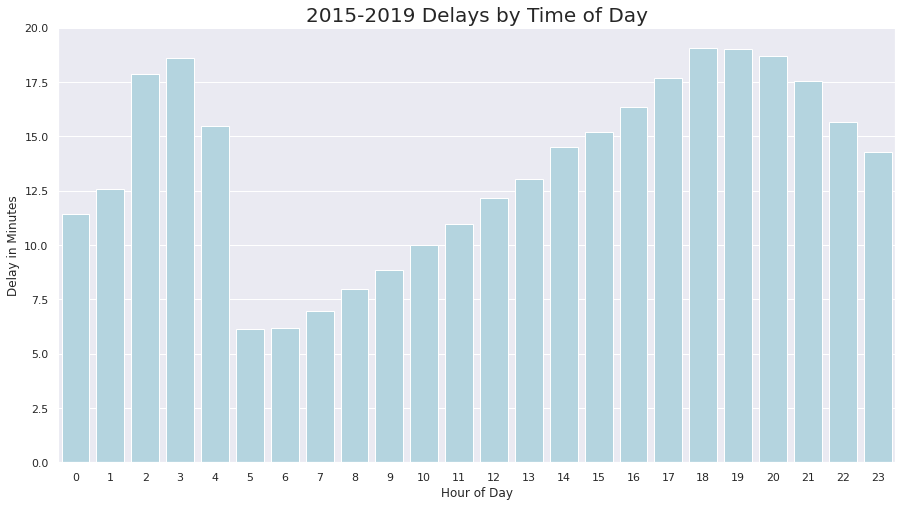

Text(0.5, 1.0, '2015-2019 Delays by Time of Day')

In [0]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.barplot(x = 'depart_hour', y = 'avg_delay_mins',  data = delays_hourly, ci = 0,color='lightblue')
ax.set_xlabel("Hour of Day", fontsize=12)
ax.set_ylabel("Delay in Minutes", fontsize=12)
ax.set_title('2015-2019 Delays by Time of Day', fontsize=20)
#.set(title='Overall 2015-2019 Delays by Time of Day', xlabel = "Hour of Day", ylabel = "Delay in Minutes")

In [0]:
airline_delay =  spark.sql("""select string(OP_CARRIER_AIRLINE_ID) as airline, 
                                     AVG(DEP_DELAY_NEW) as avg_delay_mins
                                    from final_df
                                    group by  OP_CARRIER_AIRLINE_ID
                                          """).cache()

In [0]:
airline_delays = airline_delay.toPandas()

In [0]:
airline_delays.sort_values(by=['avg_delay_mins'], ascending=False, inplace=True)

In [0]:
airlines = pd.DataFrame({'OP_CARRIER':["OO","OH","VX","US","NK","EV","YX","F9","B6","AA","MQ","9E","AS","DL","UA","YV","HA","WN","G4"],
       'airline':["20304","20397","21171","20355","20416","20366","20452","20436","20409","19805","20398","20363","19930","19790","19977","20378","19690","19393","20368"],
  'AIRLINE_NAME':["SkyWest","PSA","Virgin America","US Airways","Spirit","ExpressJet","Republic","Frontier","JetBlue","American","Envoy","Endeavor","Alaska","Delta","United","Mesa","Hawaiian","Southwest","Allegiant"]})

In [0]:
air_delays = pd.merge(airline_delays, airlines, how='left',on = 'airline')

Out[160]:

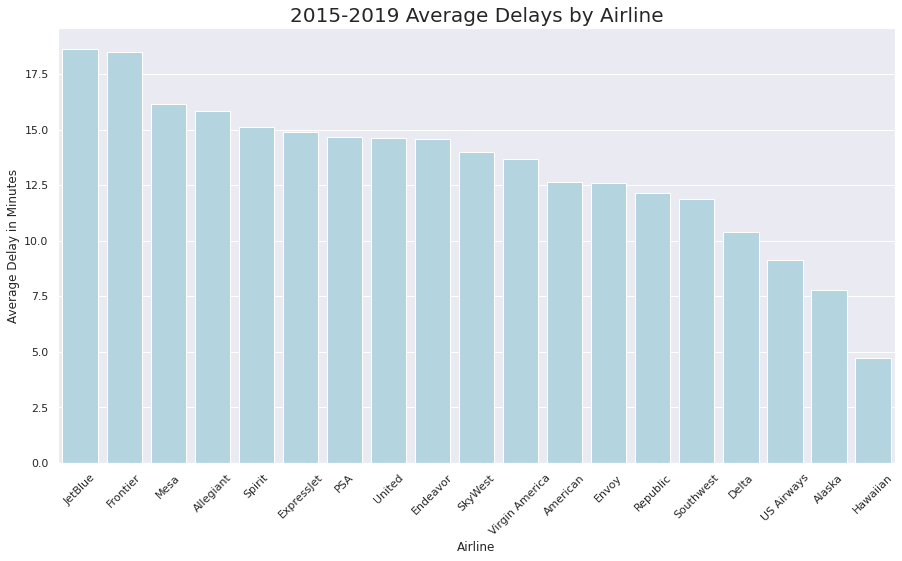

(array([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16,
 17, 18]),
 [Text(0, 0, 'JetBlue'),
 Text(1, 0, 'Frontier'),
 Text(2, 0, 'Mesa'),
 Text(3, 0, 'Allegiant'),
 Text(4, 0, 'Spirit'),
 Text(5, 0, 'ExpressJet'),
 Text(6, 0, 'PSA'),
 Text(7, 0, 'United'),
 Text(8, 0, 'Endeavor'),
 Text(9, 0, 'SkyWest'),
 Text(10, 0, 'Virgin America'),
 Text(11, 0, 'American'),
 Text(12, 0, 'Envoy'),
 Text(13, 0, 'Republic'),
 Text(14, 0, 'Southwest'),
 Text(15, 0, 'Delta'),
 Text(16, 0, 'US Airways'),
 Text(17, 0, 'Alaska'),
 Text(18, 0, 'Hawaiian')])

In [0]:
sns.set(style='whitegrid')
sns.set(rc = {'figure.figsize':(15,8)})
ax = sns.barplot(x = 'AIRLINE_NAME', y = 'avg_delay_mins',  data = air_delays.reset_index(), ci = 0,color='lightblue')
ax.set_xlabel("Airline", fontsize=12)
ax.set_ylabel("Average Delay in Minutes", fontsize=12)
ax.set_title('2015-2019 Average Delays by Airline', fontsize=20)
#.set(title='Overall 2015-2019 Average Delays by Airline', xlabel = "Airline", ylabel = "Average Delay in Minutes")
plt.xticks(rotation=45)